In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
%matplotlib inline

## to import datetime library
from datetime import datetime
import datetime as dt


#Import necessary statistical libraries
import scipy.stats as stats
import statsmodels.api as sm
from scipy.stats import norm
#import libraries for ML-Model
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import  MinMaxScaler
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from sklearn.linear_model import  LinearRegression, Lasso, Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import  BaggingRegressor, ExtraTreesRegressor, RandomForestRegressor,StackingRegressor
from sklearn.model_selection import GridSearchCV
from xgboost import XGBRegressor
import lightgbm
from lightgbm import LGBMRegressor
# libraries for save the model
import pickle

In [43]:
import warnings
warnings.filterwarnings('ignore')

In [22]:
df = pd.read_csv('/content/drive/MyDrive/datasets/Appliances/data_application_energy (1).csv')

In [24]:
df.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [25]:
df.shape

(19735, 29)

In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         19735 non-null  object 
 1   Appliances   19735 non-null  int64  
 2   lights       19735 non-null  int64  
 3   T1           19735 non-null  float64
 4   RH_1         19735 non-null  float64
 5   T2           19735 non-null  float64
 6   RH_2         19735 non-null  float64
 7   T3           19735 non-null  float64
 8   RH_3         19735 non-null  float64
 9   T4           19735 non-null  float64
 10  RH_4         19735 non-null  float64
 11  T5           19735 non-null  float64
 12  RH_5         19735 non-null  float64
 13  T6           19735 non-null  float64
 14  RH_6         19735 non-null  float64
 15  T7           19735 non-null  float64
 16  RH_7         19735 non-null  float64
 17  T8           19735 non-null  float64
 18  RH_8         19735 non-null  float64
 19  T9  

In [27]:
df.describe()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,3.801875,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,...,19.485828,41.552401,7.411665,755.522602,79.750418,4.039752,38.330834,3.760707,24.988033,24.988033
std,102.524891,7.935988,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,...,2.014712,4.151497,5.317409,7.399441,14.901088,2.451221,11.794719,4.194648,14.496634,14.496634
min,10.000000,0.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,...,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322
25%,50.000000,0.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,...,18.000000,38.500000,3.666667,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889
50%,60.000000,0.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,...,19.390000,40.900000,6.916667,756.100000,83.666667,3.666667,40.000000,3.433333,24.897653,24.897653
75%,100.000000,0.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,...,20.600000,44.338095,10.408333,760.933333,91.666667,5.500000,40.000000,6.566667,37.583769,37.583769
max,1080.000000,70.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,...,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530


We can sense some outliers at first glance in the data
- Appliances column for example

# show duplicate column

In [28]:
Columns = df.columns
Columns

dup = df.pivot_table(index=['date', 'Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3','RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8',
                                'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed','Visibility', 'Tdewpoint', 'rv1', 'rv2'],aggfunc='size')

print(dup)

date                 Appliances  lights  T1         RH_1       T2         RH_2       T3         RH_3       T4         RH_4       T5         RH_5       T6         RH_6       T7         RH_7       T8       RH_8       T9         RH_9     T_out      Press_mm_hg  RH_out     Windspeed  Visibility  Tdewpoint  rv1        rv2      
2016-01-11 17:00:00  60          30      19.890000  47.596667  19.200000  44.790000  19.790000  44.730000  19.000000  45.566667  17.166667  55.200000  7.026667   84.256667  17.200000  41.626667  18.2000  48.900000  17.033333  45.5300  6.600000   733.5        92.000000  7.000000   63.000000   5.300000   13.275433  13.275433    1
2016-01-11 17:10:00  60          30      19.890000  46.693333  19.200000  44.722500  19.790000  44.790000  19.000000  45.992500  17.166667  55.200000  6.833333   84.063333  17.200000  41.560000  18.2000  48.863333  17.066667  45.5600  6.483333   733.6        92.000000  6.666667   59.166667   5.200000   18.606195  18.606195    1
2016-01-11 17:2

In [30]:
dup_Count =  len(df)-len(df.drop_duplicates())
print(dup_Count)

0


In [31]:
dup_count_1 = df[df.duplicated()].shape
print(dup_count_1)

(0, 29)


There is no duplicated rows in the data

In [32]:
df.isnull().sum().sum()

0

What did you know about your dataset?
The dataset provided contains 29 columns and 19735 rows and does not have any missing or duplicate values.

The goal is to predict the energy use of appliances. Demand prediction involves analytical studies on the probability of house temperature and humidity conditions, which were monitored with a ZigBee wireless sensor network for 10 minutes for about 4.5 months.

There are no duplicate columns

There are no missing values

# understanding Variables

In [33]:
df.columns

Index(['date', 'Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3',
       'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8',
       'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed',
       'Visibility', 'Tdewpoint', 'rv1', 'rv2'],
      dtype='object')

**Date**- time year-month-day hour:minute:second

**Appliances**- energy use in Wh

**Lights**- energy use of light fixtures in the house in Wh

**T1**- Temperature in kitchen area, in Celsius

**RH_1**- Humidity in kitchen area, in %

**T2**-Temperature in living room area, in Celsius

**RH_2**- Humidity in living room area, in %

**T3**- Temperature in laundry room area

**RH_3**- Humidity in laundry room area, in %

**T4**- Temperature in office room, in Celsius

**RH_4**- Humidity in office room, in %

**T5**- Temperature in bathroom, in Celsius

**RH_5**- Humidity in bathroom, in %

**T6**- Temperature outside the building (north side), in Celsius

**RH_6**- Humidity outside the building (north side), in %

**T7**-Temperature in ironing room , in Celsius

**RH_7**- Humidity in ironing room, in %

**T8**- Temperature in teenager room 2, in Celsius

**RH_8**- Humidity in teenager room 2, in %

**T9**-Temperature in parents room, in Celsius

**RH_9**- Humidity in parents room, in %

**To**-Temperature outside (from Chievres weather station), in Celsius

**Pressure (from Chievres weather station)**- in mm Hg

**RH_out**- Humidity outside (from Chievres weather station), in %

**Wind speed (from Chievres weather station)**- in m/s

**Visibility (from Chievres weather station)**-in km

**Tdewpoint (from Chievres weather station)**- Â°C

**rv1**- Random variable 1, nondimensional

**rv2**- Random variable 2, nondimensional







#Unique Values

In [35]:
def unique(df):
  for column in df.columns:
    len(df[column].unique())
    print(f'No of unique values for {column} : {len(df[column].unique())}')


unique(df)

No of unique values for date : 19735
No of unique values for Appliances : 92
No of unique values for lights : 8
No of unique values for T1 : 722
No of unique values for RH_1 : 2547
No of unique values for T2 : 1650
No of unique values for RH_2 : 3376
No of unique values for T3 : 1426
No of unique values for RH_3 : 2618
No of unique values for T4 : 1390
No of unique values for RH_4 : 2987
No of unique values for T5 : 2263
No of unique values for RH_5 : 7571
No of unique values for T6 : 4446
No of unique values for RH_6 : 9709
No of unique values for T7 : 1955
No of unique values for RH_7 : 5891
No of unique values for T8 : 2228
No of unique values for RH_8 : 6649
No of unique values for T9 : 924
No of unique values for RH_9 : 3388
No of unique values for T_out : 1730
No of unique values for Press_mm_hg : 2189
No of unique values for RH_out : 566
No of unique values for Windspeed : 189
No of unique values for Visibility : 413
No of unique values for Tdewpoint : 1409
No of unique values f

# Data Wrangling

In [36]:
df_energy = df.copy()
df_energy.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [37]:
df_energy.rename(columns={'T1': 'temp_kitchen', 'RH_1':'hu_Kitchen', 'T2':'temp_living_room', 'RH_2': 'hu_living', 'T3':'temp_Laundry_room',
       'RH_3':'hu_laundry', 'T4':'temp_office_room', 'RH_4':'hu_office', 'T5':'temp_bathroom', 'RH_5':'hu_bath', 'T6':'temp_build_out'
       , 'RH_6':'hu_build_out', 'T7':'temp_ironing_room', 'RH_7':'hu_ironing_room', 'T8':'temp_teen_room',
       'RH_8':'hu_teen', 'T9':'temp_parents_room', 'RH_9':'hu_parent', 'T_out':'temp_out', 'RH_out':'out_humidity'},inplace = True)


In [38]:
df_energy.columns

Index(['date', 'Appliances', 'lights', 'temp_kitchen', 'hu_Kitchen',
       'temp_living_room', 'hu_living', 'temp_Laundry_room', 'hu_laundry',
       'temp_office_room', 'hu_office', 'temp_bathroom', 'hu_bath',
       'temp_build_out', 'hu_build_out', 'temp_ironing_room',
       'hu_ironing_room', 'temp_teen_room', 'hu_teen', 'temp_parents_room',
       'hu_parent', 'temp_out', 'Press_mm_hg', 'out_humidity', 'Windspeed',
       'Visibility', 'Tdewpoint', 'rv1', 'rv2'],
      dtype='object')

In [39]:
df_energy['date'] = pd.to_datetime(df_energy['date'])

def add_time(df):
  df_energy['month'] = df_energy['date'].dt.month
  df_energy['weekday'] = df_energy['date'].dt.weekday
  df_energy['hour'] = df_energy['date'].dt.hour



add_time(df_energy)
#drop the date column
df_energy.drop('date',axis=1,inplace=True)


# Print the updated dataframe
df_energy.head()

,Appliances,lights,temp_kitchen,hu_Kitchen,temp_living_room,hu_living,temp_Laundry_room,hu_laundry,temp_office_room,hu_office,...,Press_mm_hg,out_humidity,Windspeed,Visibility,Tdewpoint,rv1,rv2,month,weekday,hour
0,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,...,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433,1,0,17
1,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,...,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195,1,0,17
2,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,...,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668,1,0,17
3,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,...,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389,1,0,17
4,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,...,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097,1,0,17


In [40]:

#separate column list for better analysis
temp_cols=['temp_kitchen','temp_living_room','temp_Laundry_room','temp_office_room','temp_bathroom','temp_build_out','temp_ironing_room','temp_teen_room','temp_parents_room']
hu_cols=['hu_Kitchen','hu_living','hu_laundry', 'hu_office','hu_bath','hu_build_out','hu_ironing_room','hu_teen','hu_parent']
light_cols=['light']
weather_cols=['temp_out','out_humidity',"Tdewpoint","Press_mm_hg","Windspeed","Visibility"]
date_col = ['month','weekday','hour']
random_col = ["rv1","rv2"]

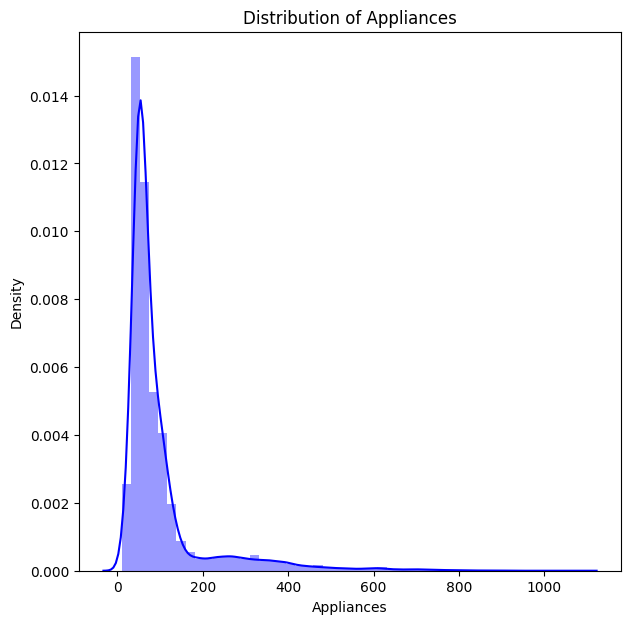

In [45]:
plt.figure(figsize=(7,7))
sns.distplot(df_energy['Appliances'], color = 'Blue')
plt.title('Distribution of Appliances')
plt.show()

the dependent varaible "appliances" has postive skweness that data is more likely distrubted in the right hand side of the mean.

we need to the deal with skewness by applying log tansfromation to get the skewness in to noraml disturbtion to anlaze the data





<Axes: xlabel='Appliances', ylabel='Density'>

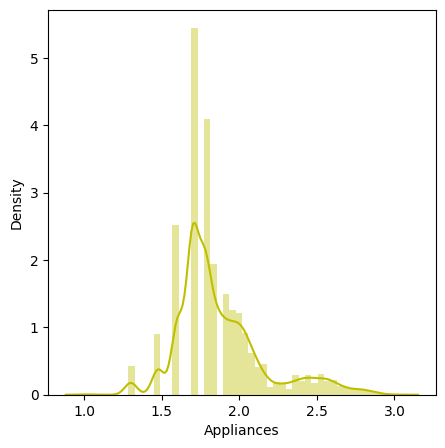

In [46]:
plt.figure(figsize=(5,5))
sns.distplot(np.log10(df_energy['Appliances']),color="y")

Now the data is normally distrubted that is many assumption of the varable to analyze the data or applying the linear regression model



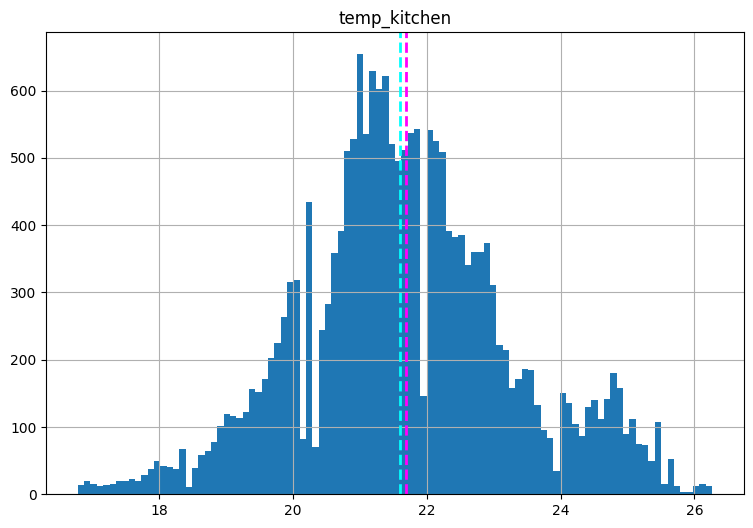

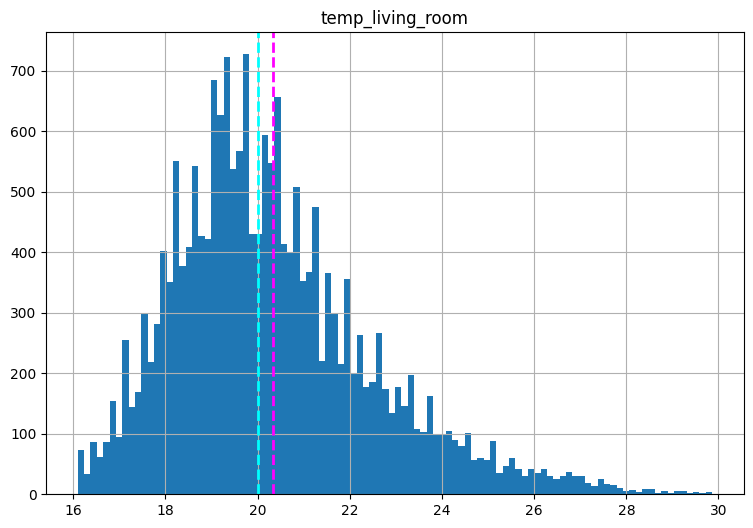

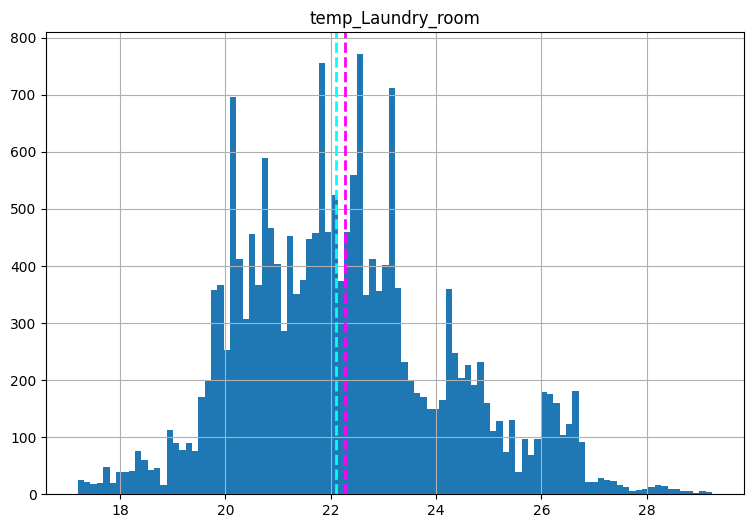

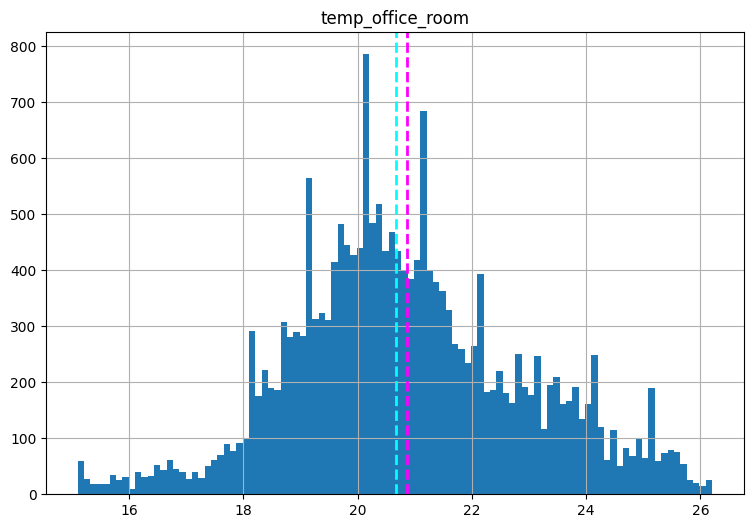

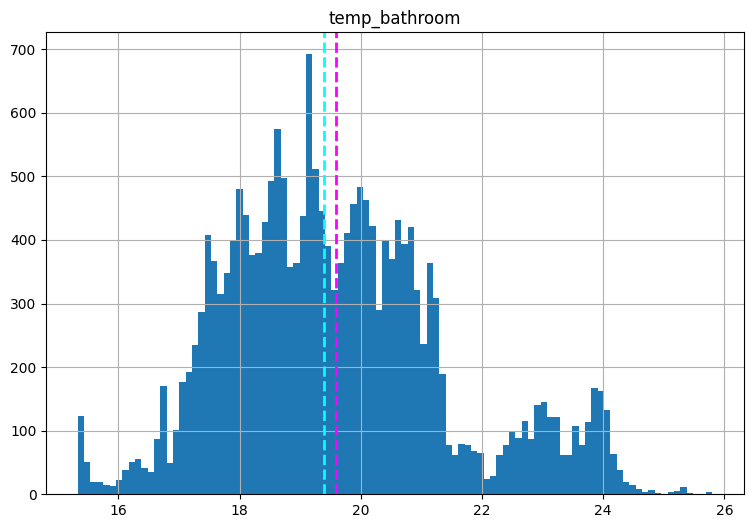

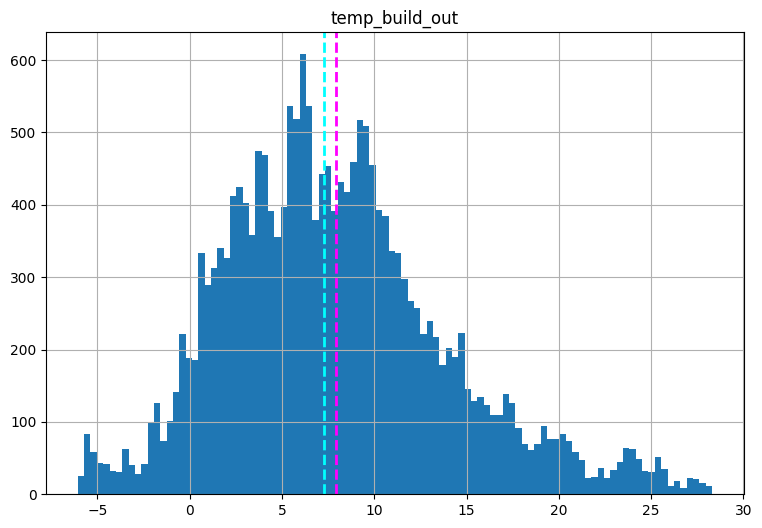

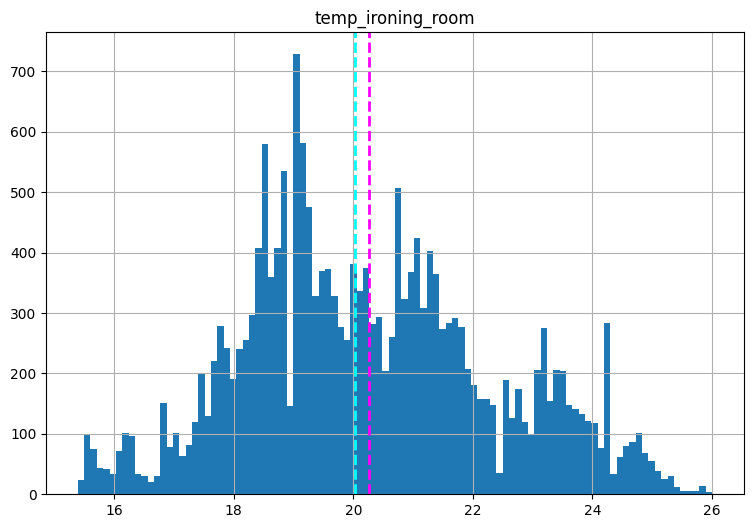

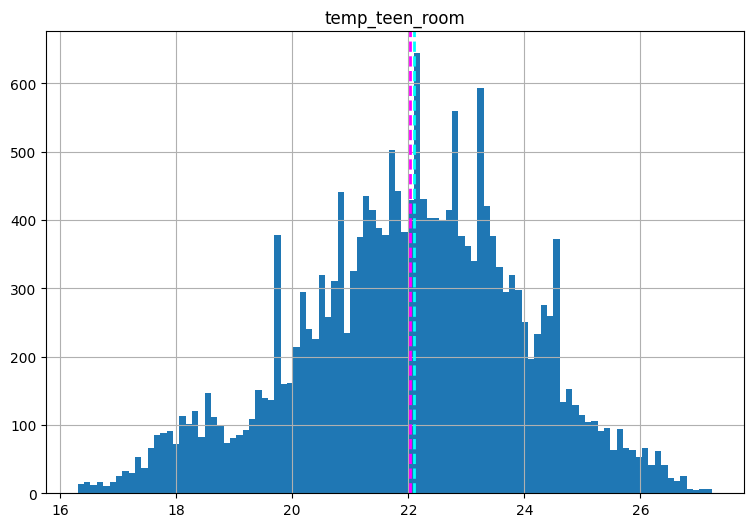

In [47]:
for col in temp_cols[:-1]:
    fig = plt.figure(figsize=(9,6))
    ax = fig.gca()
    feature = (df_energy[col])
    feature.hist(bins=100, ax = ax)
    ax.axvline(df_energy[col].mean(), color='magenta', linestyle='dashed', linewidth=2)
    ax.axvline(feature.median(), color='cyan', linestyle='dashed', linewidth=2)
    ax.set_title(col)
plt.show()

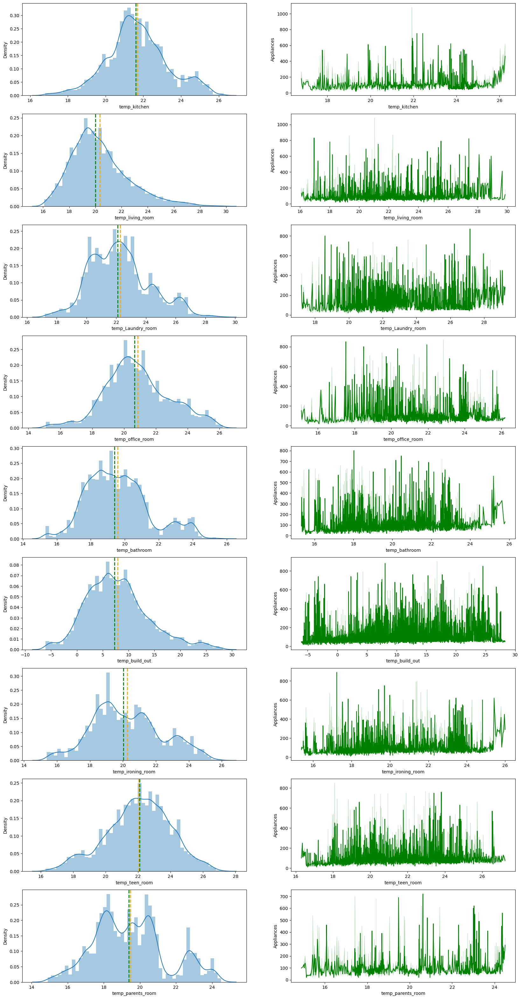

In [48]:
n=len(temp_cols)
fig,ax=plt.subplots(len(temp_cols),2,figsize=(20,40))
for i,col in enumerate(temp_cols):
  #univariate of the columns
  dist=sns.distplot(df_energy[col],ax=ax[i,0])
  ax[i,0].axvline(df_energy[col].mean(), color='orange', linestyle='dashed', linewidth=2)
  ax[i,0].axvline(df_energy[col].median(), color='green', linestyle='dashed', linewidth=2)
  #Bivariate Analysis the Appliance Energy
  #lineplot
  scatter=sns.lineplot(data=df_energy,x=col,y='Appliances',color='green',ax=ax[i,1]);

In [49]:
for col  in temp_cols:
  skewness = df_energy[col].skew(axis=0, skipna = True)
  print("The skweness of " ,col ,"is",skewness  )

The skweness of  temp_kitchen is 0.12091711738520292
The skweness of  temp_living_room is 0.8896578498994725
The skweness of  temp_Laundry_room is 0.4507773351008748
The skweness of  temp_office_room is 0.17038405715992935
The skweness of  temp_bathroom is 0.5582196988262588
The skweness of  temp_build_out is 0.5974713395616409
The skweness of  temp_ironing_room is 0.2547224169425056
The skweness of  temp_teen_room is -0.25615113577916404
The skweness of  temp_parents_room is 0.3827112390301909


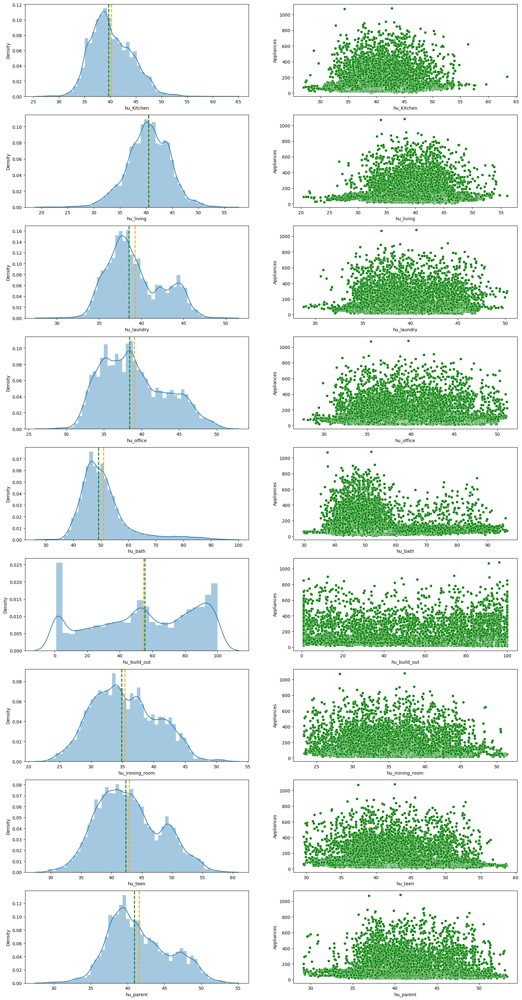

In [50]:
#visualization code
fig,ax=plt.subplots(len(hu_cols),2,figsize=(20,40))
for i,col in enumerate(hu_cols):
  #univariate of the columns
  dist=sns.distplot(df_energy[col],ax=ax[i,0])
  ax[i,0].axvline(df_energy[col].mean(), color='orange', linestyle='dashed', linewidth=2)
  ax[i,0].axvline(df_energy[col].median(), color='green', linestyle='dashed', linewidth=2)
  #Bivariate Analysis the Appliance Energy
  #lineplot
  scatter=sns.scatterplot(data=df_energy,x=col,y='Appliances',color='green',ax=ax[i,1]);

In [51]:

for col  in hu_cols:
  skewness = df_energy[col].skew(axis=0, skipna = True)
  print("The skweness of " ,col ,"is",skewness  )

The skweness of  hu_Kitchen is 0.46577375642231555
The skweness of  hu_living is -0.26824717344228066
The skweness of  hu_laundry is 0.46758907995240717
The skweness of  hu_office is 0.4446143392062077
The skweness of  hu_bath is 1.8668200195471256
The skweness of  hu_build_out is -0.24196120045189282
The skweness of  hu_ironing_room is 0.24214082895027994
The skweness of  hu_teen is 0.30803561491175263
The skweness of  hu_parent is 0.36893704325030624


**What is/are the insight(s) found from the chart?**

All humidity distribution is follwed normal distribution except Humidit in bathroom building humidity. *The living room and bulid out side humdityi is slightly negatively skewed and all the other humdity follows mostly normal disturbtion except for the bathroom humdity it is highly postively skewed.
In inside building the mean and median value of humidity distribution lies between 35 to 45 percent,except bathroom humidity and it is near about 50 percent.
For outside building humidity, the mean and median value is around 55 percent.
For inside building low and high humidity causes low consumption of appliances energy. otherwise it causes high spreading data of energy consumption.
For outside building humidity energy consumption data is widely spread irresective of humidity.

- low humidity and high humidity can saves maximum energy. *All humidities have similar relationship with appliance energy consumption.It leads to multicolinarity.These columns will be dropped in upcoming appropriate section.

# Weather columns(uni +bi varaite anlaysis)

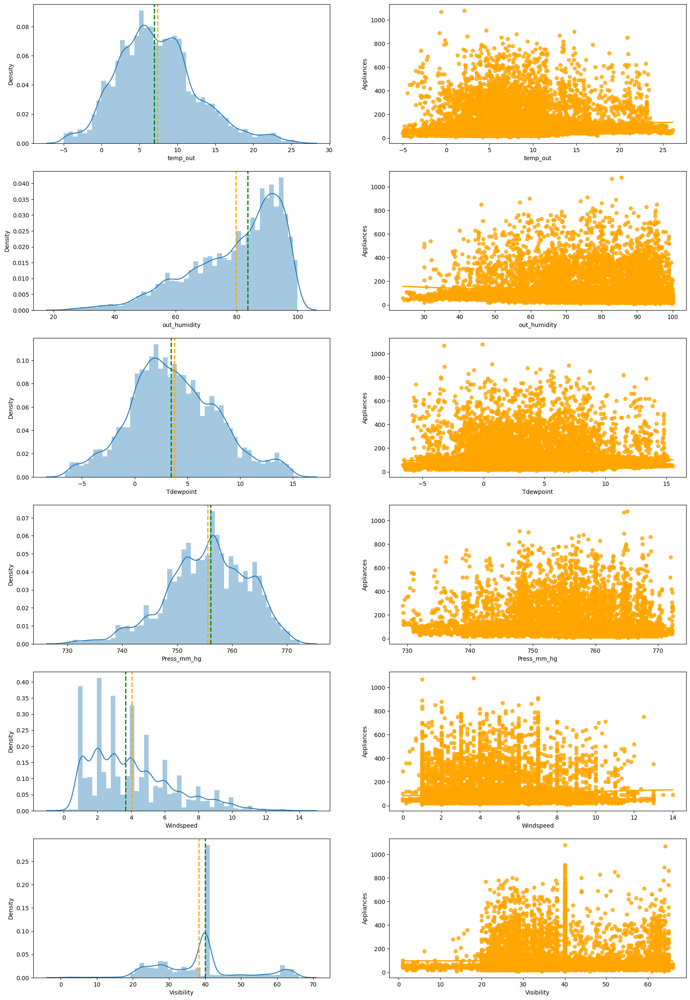

In [52]:
# Chart - 5 visualization code
fig,ax=plt.subplots(len(weather_cols),2,figsize=(20,30))
for i,col in enumerate(weather_cols):
  #univariate of the columns
  dist=sns.distplot(df_energy[col],ax=ax[i,0])
  ax[i,0].axvline(df_energy[col].mean(), color='orange', linestyle='dashed', linewidth=2)
  ax[i,0].axvline(df_energy[col].median(), color='green', linestyle='dashed', linewidth=2)
  #Bivariate Analysis the Appliance Energy
  #lineplot
  scatter=sns.regplot(data=df_energy,x=col,y='Appliances',color='orange',ax=ax[i,1]);

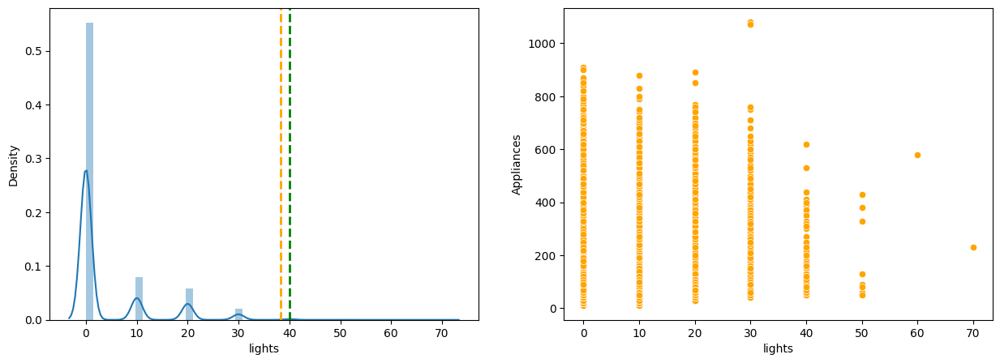

In [53]:

# Chart - 6 visualization code
fig,ax=plt.subplots(1,2,figsize=(15,5))

  #univariate of the columns
dist=sns.distplot(df_energy['lights'],ax=ax[0])
ax[0].axvline(df_energy[col].mean(), color='orange', linestyle='dashed', linewidth=2)
ax[0].axvline(df_energy[col].median(), color='green', linestyle='dashed', linewidth=2)
  #Bivariate Analysis the Appliance Energy
  #lineplot
scatter=sns.scatterplot(data=df_energy,x='lights',y='Appliances',color='orange',ax=ax[1]);


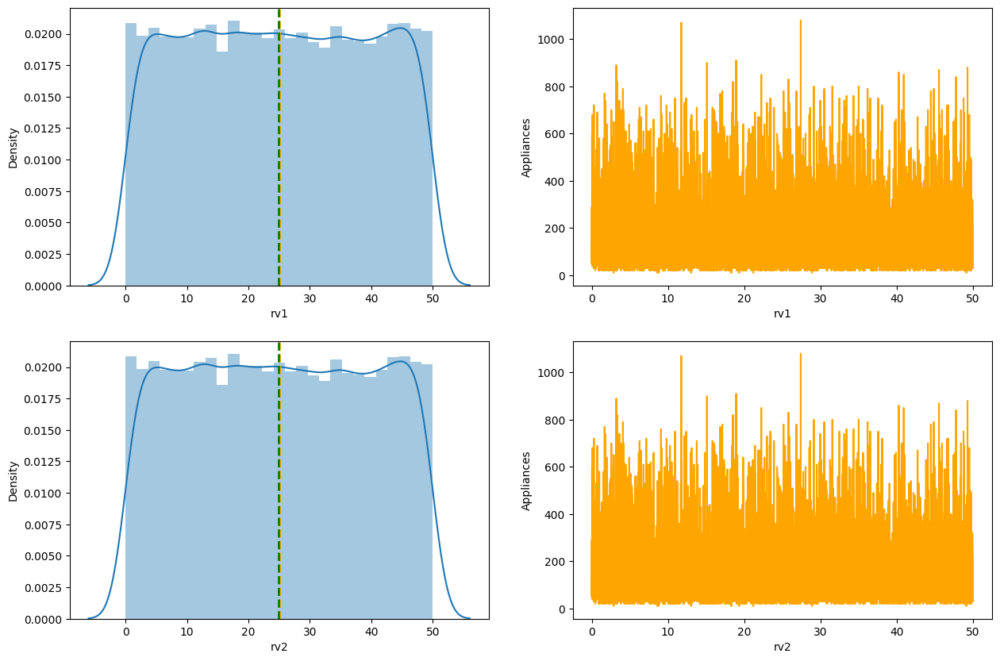

In [54]:

# Chart - 7 visualization code
fig,ax=plt.subplots(len(random_col),2,figsize=(15,10))
for i,col in enumerate(random_col):
  #univariate of the columns
  dist=sns.distplot(df_energy[col],ax=ax[i,0])
  ax[i,0].axvline(df_energy[col].mean(), color='orange', linestyle='dashed', linewidth=2)
  ax[i,0].axvline(df_energy[col].median(), color='green', linestyle='dashed', linewidth=2)
  #Bivariate Analysis the Appliance Energy
  #lineplot
  scatter=sns.lineplot(data=df_energy,x=col,y='Appliances',color='orange',ax=ax[i,1]);

# Correlation heatmap

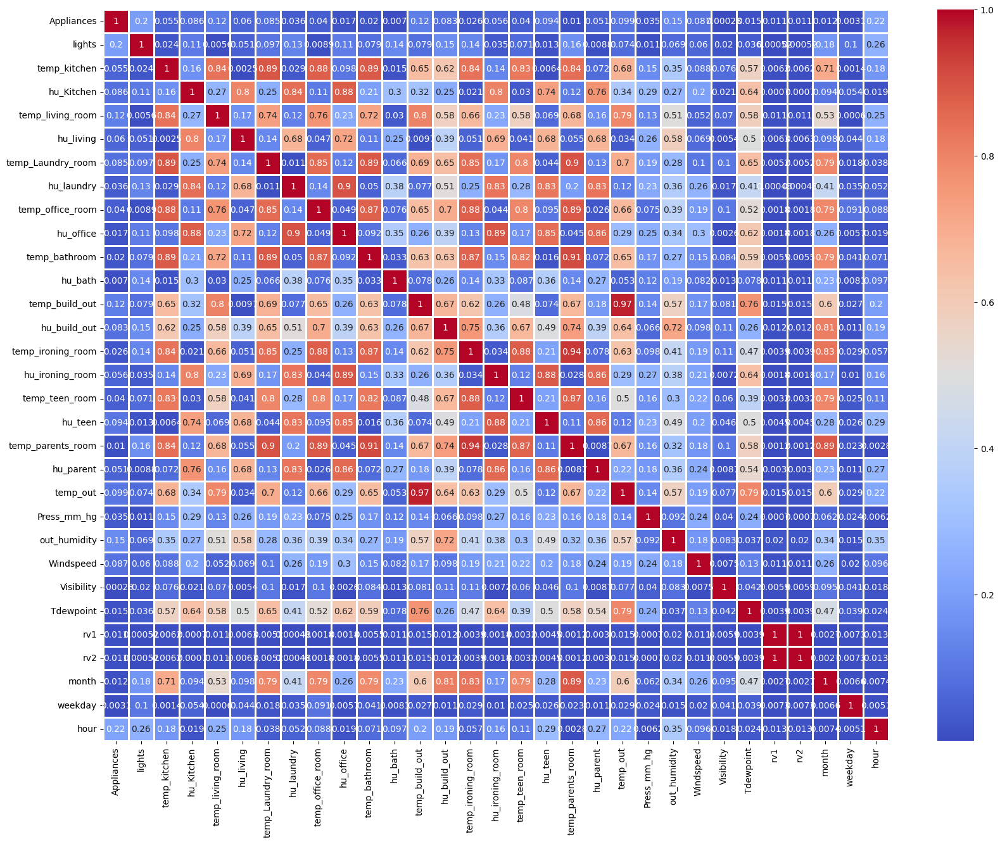

In [55]:
# Correlation Heatmap visualization code
plt.figure(figsize=(20,15))
correlation = df_energy.corr()
sns.heatmap(abs(correlation) ,annot =True , cmap = 'coolwarm', linewidth = 1)
plt.show()

# Correclation map of temp columns and appliance

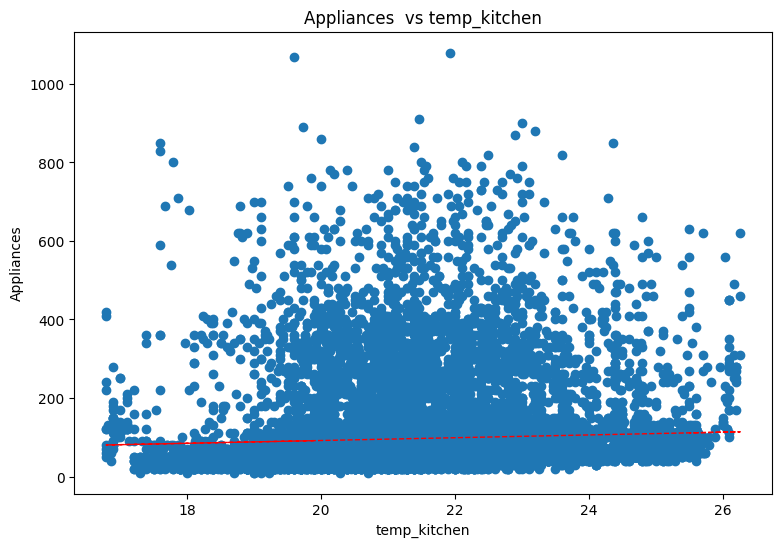

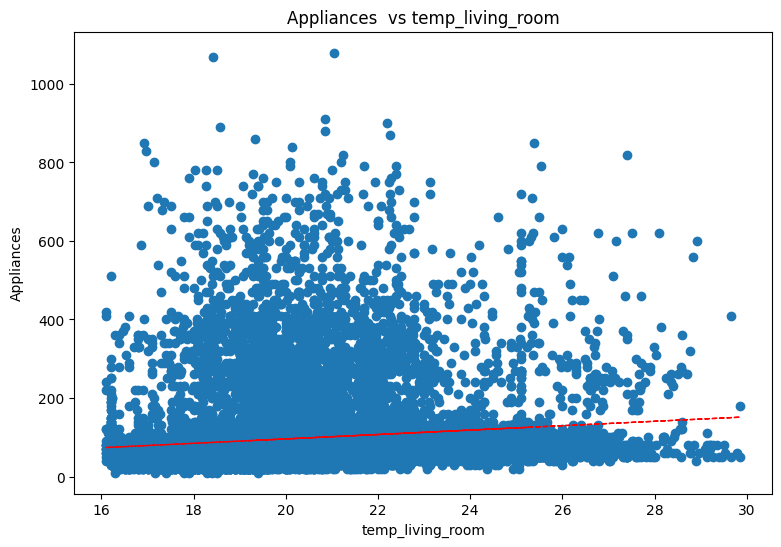

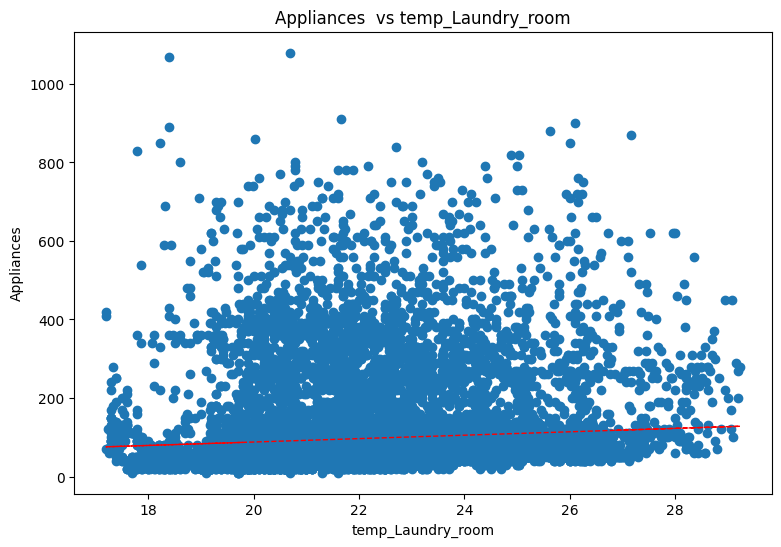

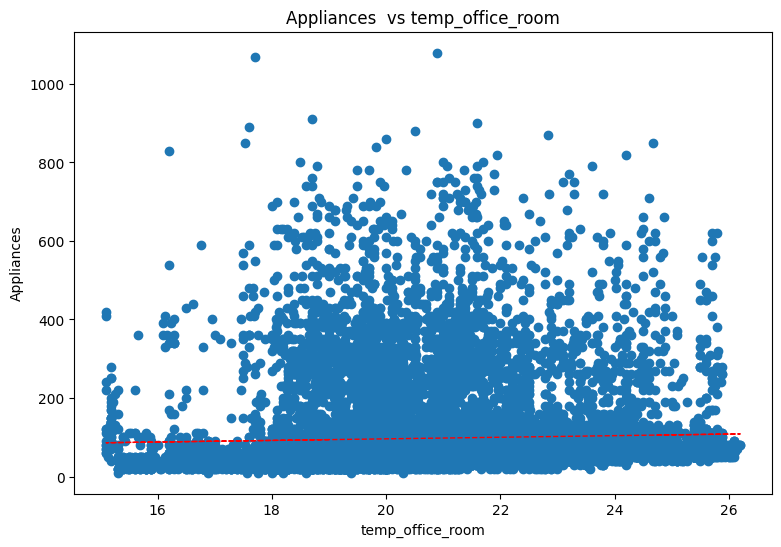

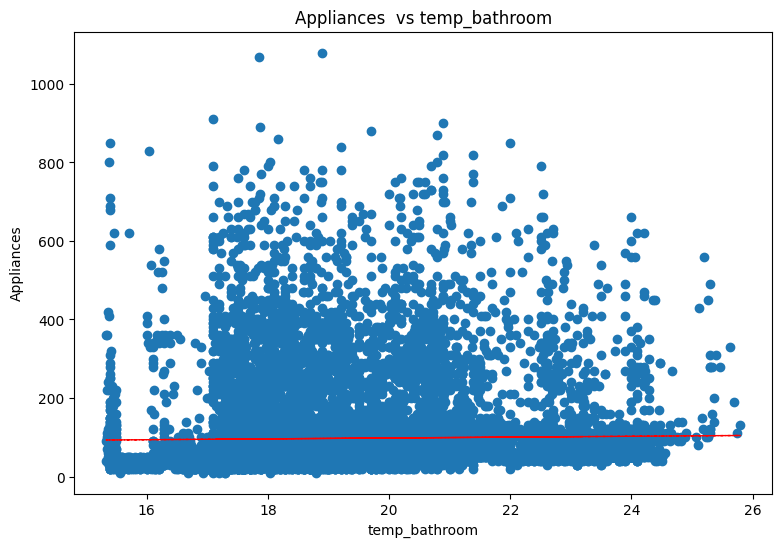

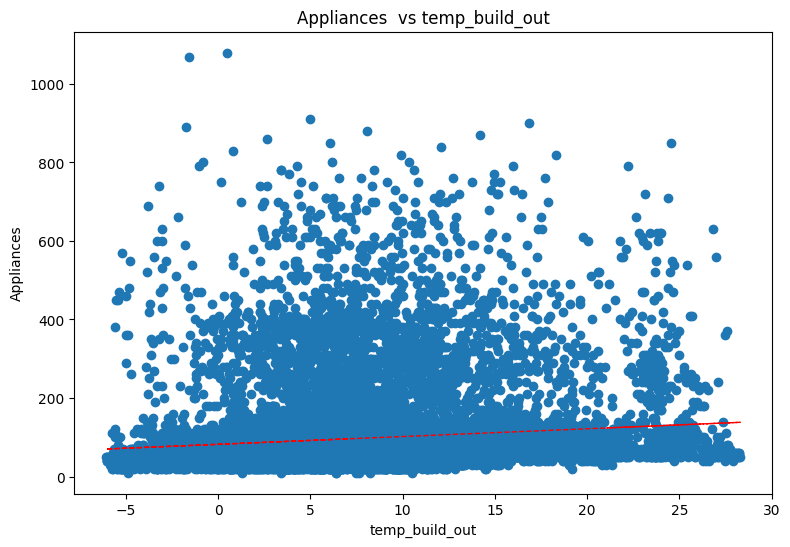

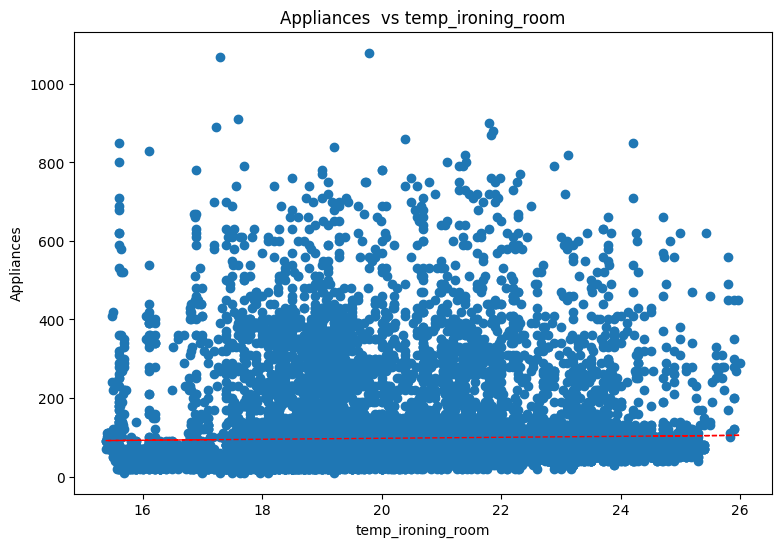

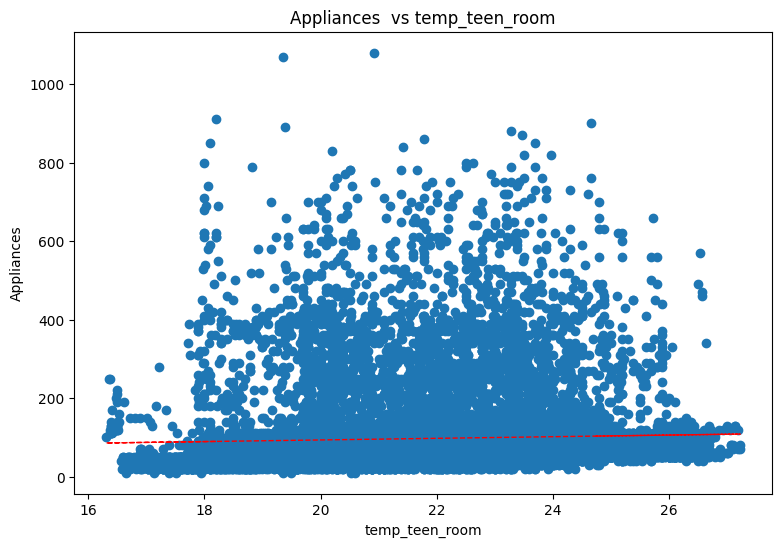

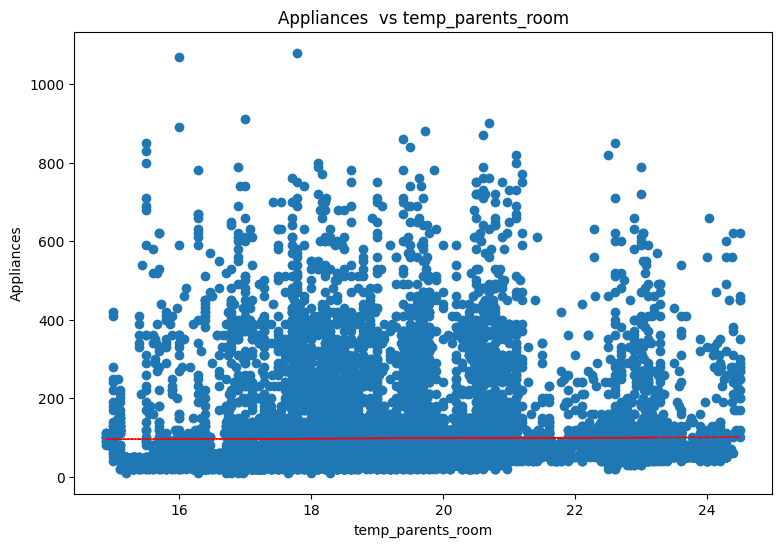

In [59]:
for col in temp_cols[:]:
  fig = plt.figure(figsize=(9,6))
  ax = fig.gca()
  feature = df_energy[col]
  label = df_energy['Appliances']
  correaltion = feature.corr(label)
  plt.scatter(x=feature,y =label)
  plt.xlabel(col)
  plt.ylabel('Appliances')
  ax.set_title('Appliances  vs ' + col)
  z = np.polyfit(df_energy[col], df_energy['Appliances'], 1)
  y_hat = np.poly1d(z)(df_energy[col])

  plt.plot(df_energy[col], y_hat, "r--", lw=1)

plt.show()

- this plot can illustrate the corrleation between the tempreture columns and appliance enrgy consumption
it shows the linear independce of one variabe with the dependent variable.
- The corelation value states that the all tempereature columns are less correalted with appiances and has not much siginfically linearly correaltion with each other
Althuough the tempreature columns are highy correlated with each other that leads to multicollineratity need to take care of in model analysis

# Corelation maps with humdity columns

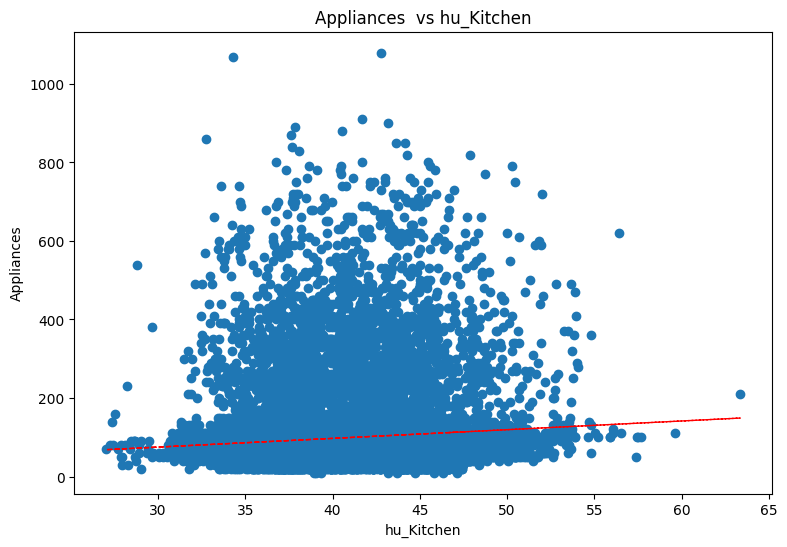

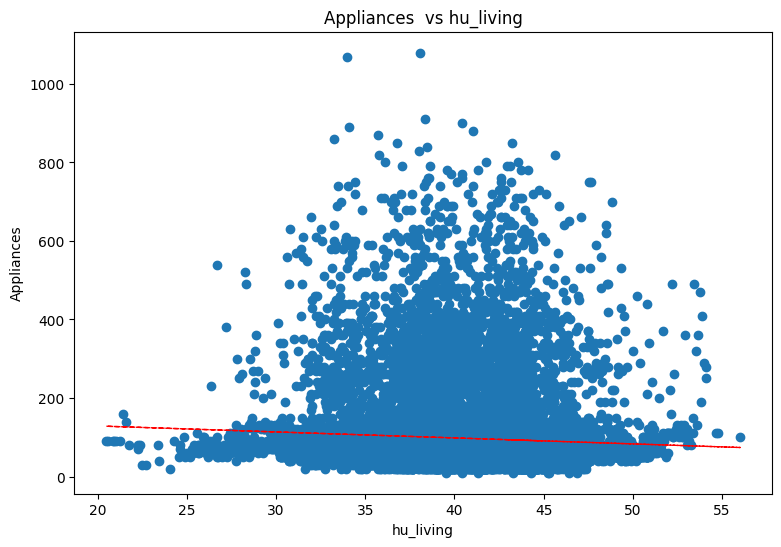

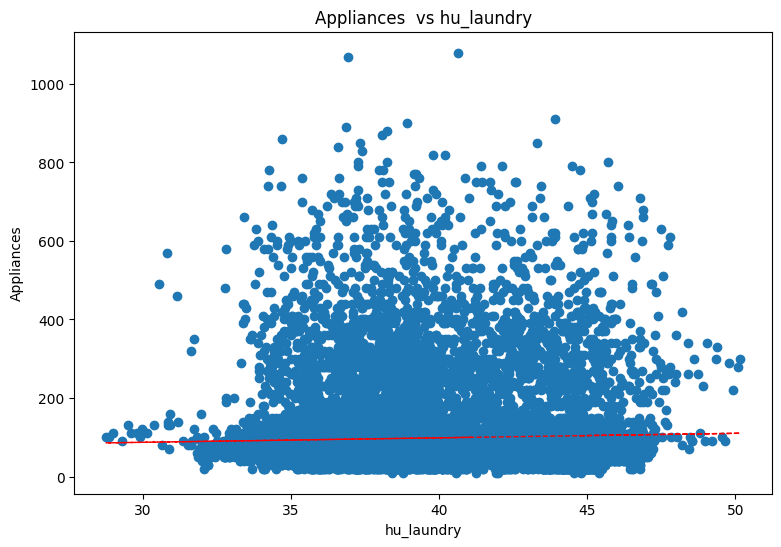

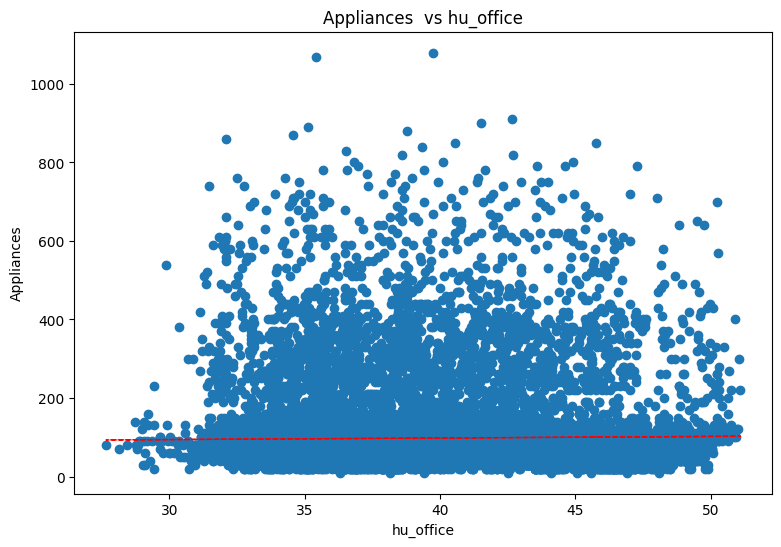

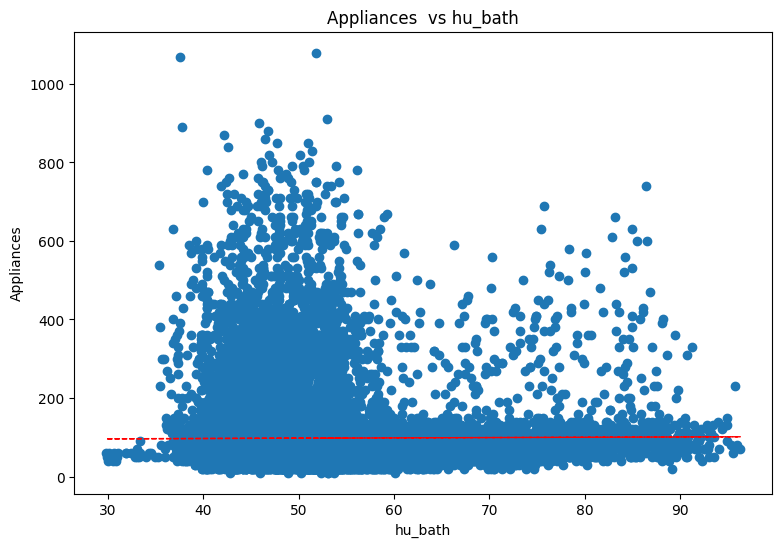

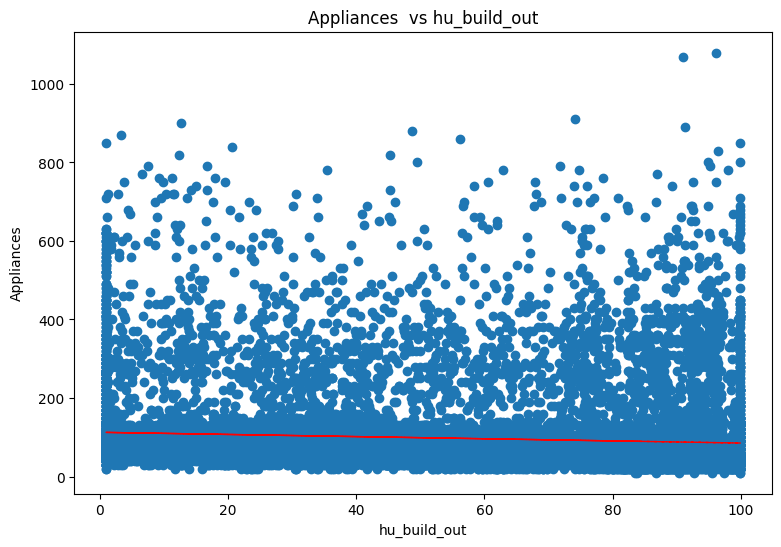

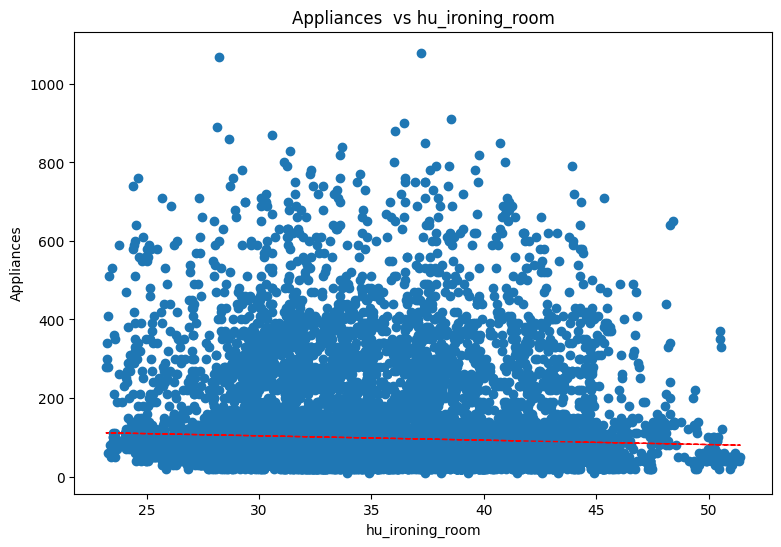

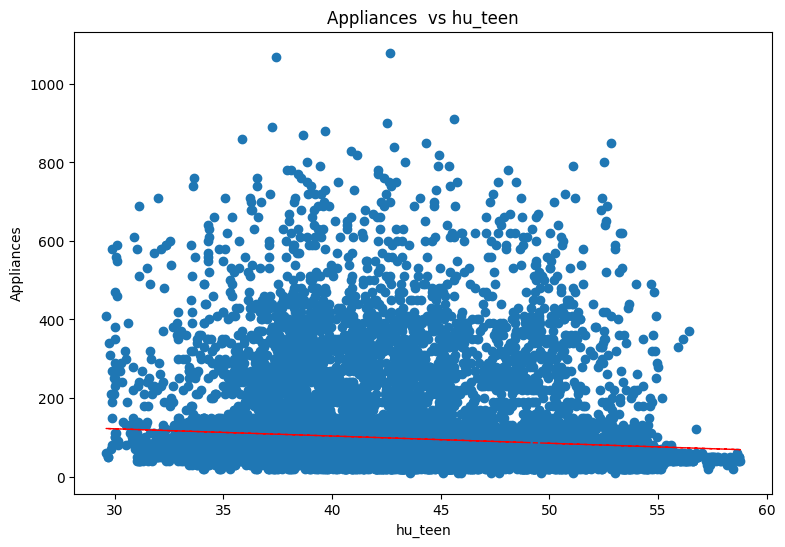

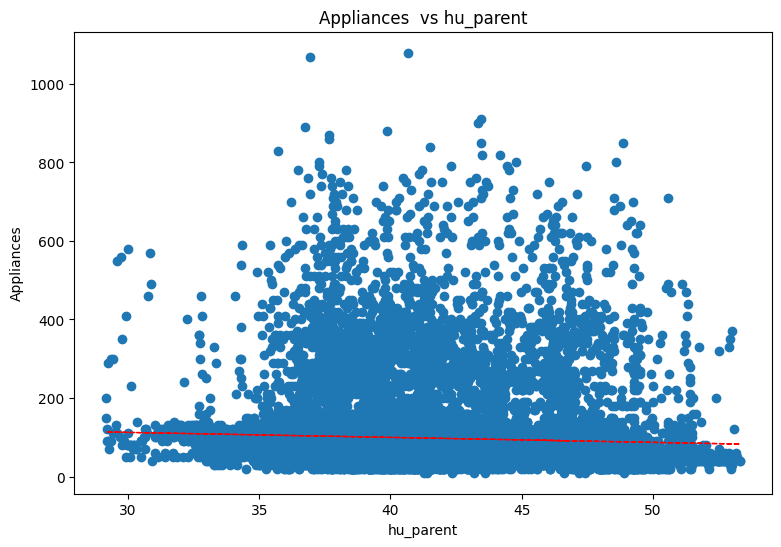

In [60]:
for col in hu_cols[:]:
  fig = plt.figure(figsize=(9,6))
  ax = fig.gca()
  feature = df_energy[col]
  label = df_energy['Appliances']
  correaltion = feature.corr(label)
  plt.scatter(x= feature,y = label)
  plt.xlabel(col)
  plt.ylabel('Appliances')
  ax.set_title('Appliances  vs ' + col)
  z = np.polyfit(df_energy[col], df_energy['Appliances'], 1)
  y_hat = np.poly1d(z)(df_energy[col])

  plt.plot(df_energy[col], y_hat, "r--", lw=1)

plt.show()

# Appliance Energy Column


<Axes: xlabel='hour', ylabel='Appliances'>

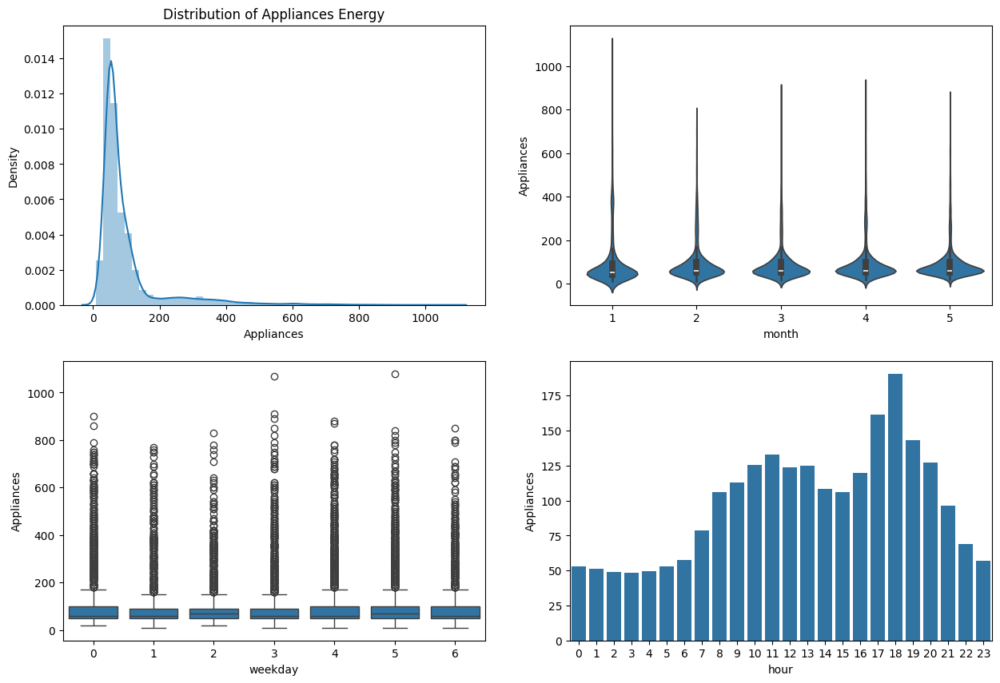

In [61]:

fig,ax=plt.subplots(2,2,figsize=(15,10))

#Distribution of Appliances
dist=sns.distplot(df_energy['Appliances'],ax=ax[0,0])
dist.set_title('Distribution of Appliances Energy')

#Average Appliances Energy over month
month_eng=pd.DataFrame(df_energy.groupby('month')['Appliances'].mean()).reset_index()
sns.violinplot(x=df_energy['month'],y=df_energy['Appliances'], ax=ax[0,1])

#Average Appliances Energy over weekdays
weekday_eng=pd.DataFrame(df_energy.groupby('weekday')['Appliances'].mean()).reset_index()
#sns.barplot(x=weekday_eng['weekday'],y=weekday_eng['Appliances'],ax=ax[1,0])
sns.boxplot(x=df_energy['weekday'],y=df_energy['Appliances'],ax=ax[1,0])
#Average Appliances Energy over hours
hour_eng=pd.DataFrame(df_energy.groupby('hour')['Appliances'].mean()).reset_index()
sns.barplot(x=hour_eng['hour'],y=hour_eng['Appliances'],ax=ax[1,1])

- In the hours of the day, 8 hrs to 21 hrs have high energy consumption.

- On Thursday and Saturday, the energy usage is high compared to the other days, and Tuesday has low energy consumption.


**In the hours of the day from 10 PM. to 7 PM., we can save the most energy and send the excess power to the grid. In the weeks of Tuesday and February, we can save the most money on power usage.**

<Figure size 2500x2500 with 0 Axes>

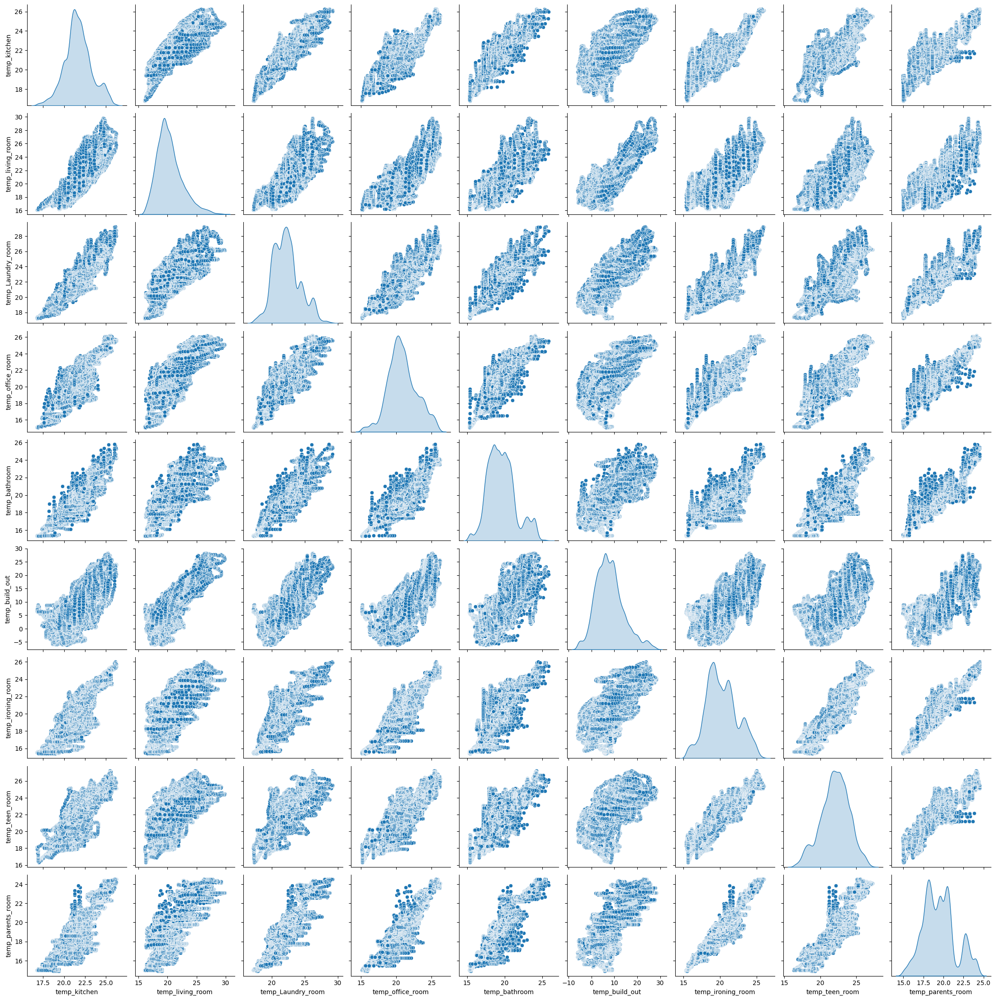

In [62]:

# Pair Plot visualization code
plt.figure(figsize=(25,25))
pair=sns.pairplot(df_energy[temp_cols], diag_kind='kde')
plt.show()


- All Temperature has linear relationship with each other.
- 'temperature of parents_room' with laundry room,bathroom,ironing room,teen room temperature has strong linear relationship.

<Figure size 2500x2500 with 0 Axes>

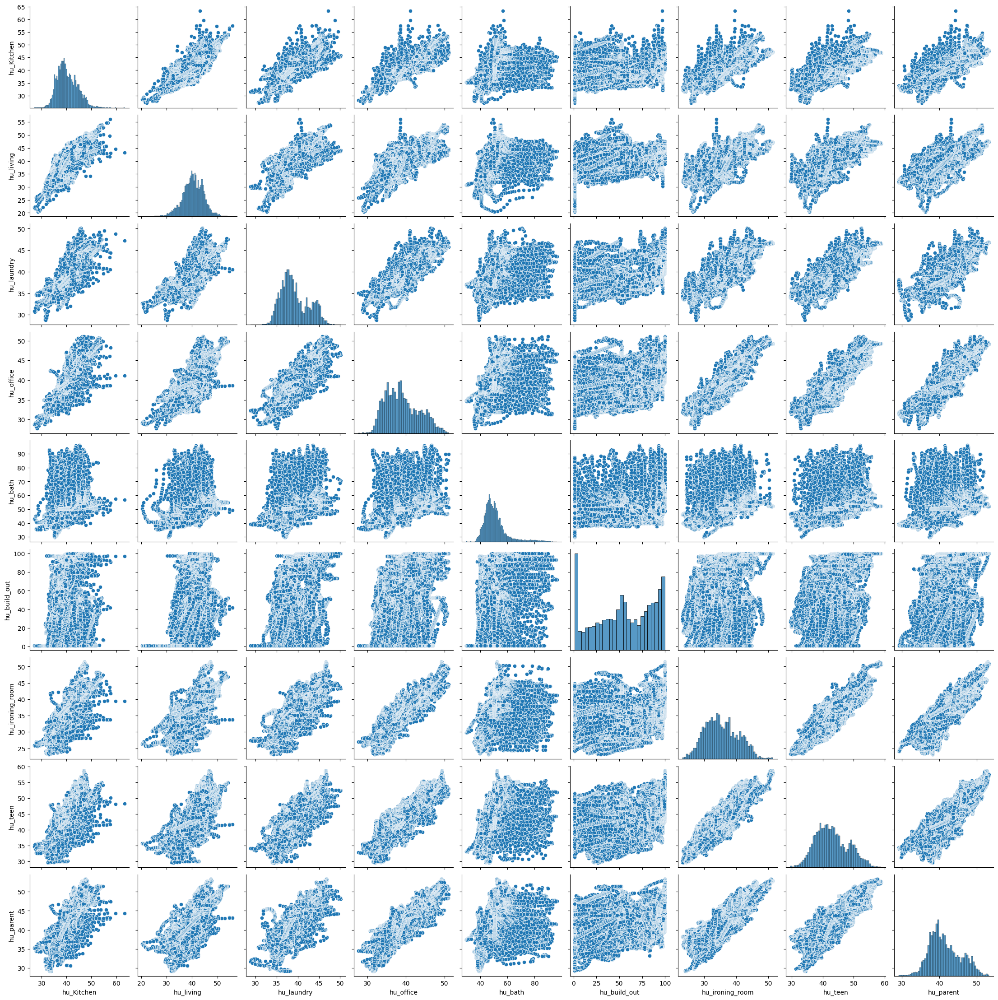

In [63]:
plt.figure(figsize=(25,25))
pair=sns.pairplot(df_energy[hu_cols], diag_kind='hist')
plt.show()

<Figure size 2500x2500 with 0 Axes>

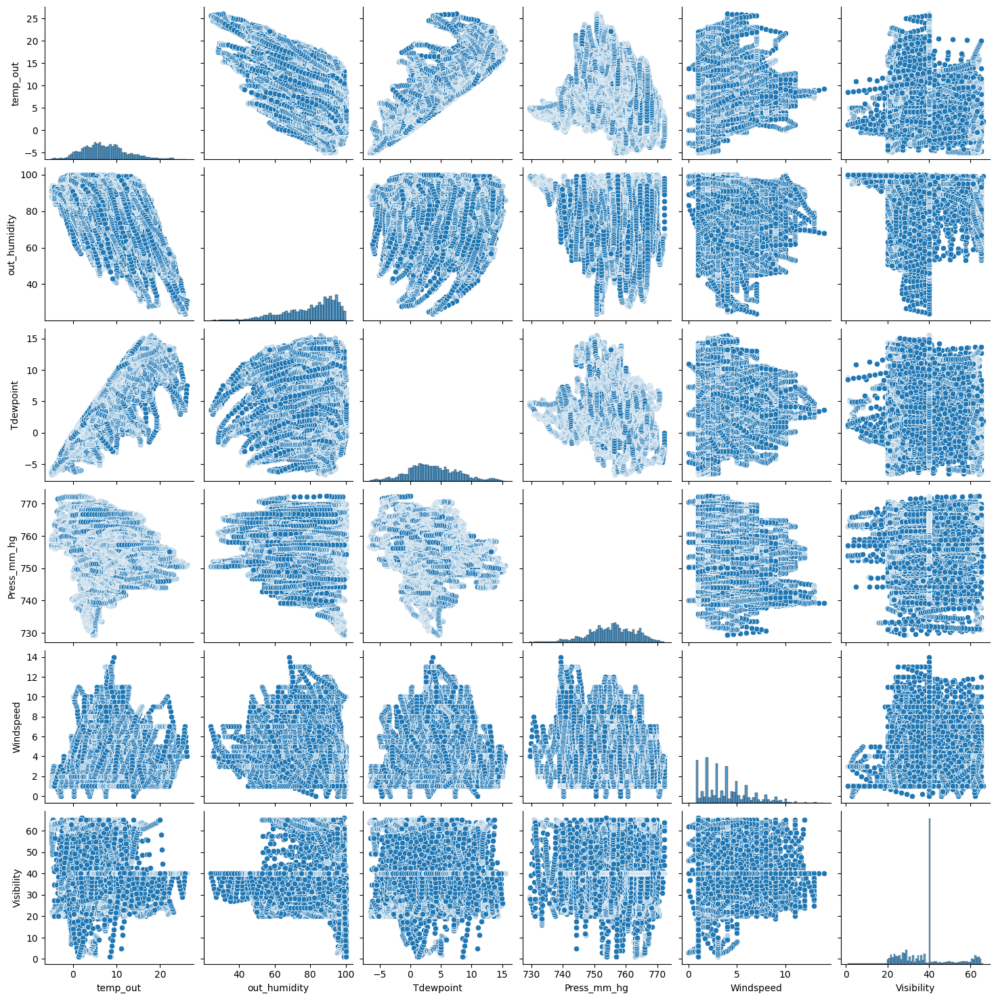

In [64]:
plt.figure(figsize=(25,25))
pair=sns.pairplot(df_energy[weather_cols], diag_kind='hist')
plt.show()

Temperature and Humidity has negative linear relationship

Temperature and Tdewpoint has positive linear relationship

Temperature may be leads into multicolinearity.

# Hypothesis Testing


# Hypothetical Statement - 1


1. There is no change in appliance energy consumption on weekdays and weekend.

2. There is no significant difference in the energy consumption for appliances between day and night.

3. The mean temperature in kitchen is greater than normal room temperature.

**Null** :- There is no change in appliance energy consumption on weekdays and weekend

**Alternate** :- There is higher appliances energy consumption on weekends as compared to weekdays.

In [70]:
# Perform Statistical Test to obtain P-Value
data_weekday = df_energy[df_energy['weekday'] <= 5][['Appliances']]
data_weekend = df_energy[df_energy['weekday'] > 5][['Appliances']]

t_stat, p_val = stats.ttest_ind(data_weekday, data_weekend, equal_var=True)
print('T-Statistics value', t_stat)
print("P-Value", p_val)




T-Statistics value [1.52771504]
P-Value [0.12659933]


In [71]:
data_weekend


,Appliances
762,30
763,40
764,50
765,60
766,50
...,...
19045,60
19046,60
19047,60
19048,60


# Hypothetical Statement - 2


**Null Hypothesis**: The mean temperature in kitchen is greater than normal room temperature.

**Alternate Hypothesis**: The temperature in Kitchen is at max room temperature and it can not be above it.

In [72]:


# Perform Statistical Test to obtain P-Value
#collect the kitchen temperature
kitchen_rand= df_energy['temp_kitchen'].sample(1000)
N=len(kitchen_rand)
#mean of the sample
kitchen_rand_mean= kitchen_rand.mean()
#Normal room temperature
nrt = 20
# the standard deviation for population
std_pop = df_energy['temp_kitchen'].std()
# Perform Statistical Test to obtain P-Value

Z_stat = ((kitchen_rand_mean - nrt)/(std_pop/np.sqrt(N)))
print(f'Z_score is {Z_stat} ')

P_value=norm.cdf(Z_stat,0,1)
print(f'P_value is {P_value} ')

Z_score is 31.025682794261478 
P_value is 1.0 



Z statistics provides precise values for testing the hypothesis. It is easily comparable to its critical levels.`According the result null hypothesis can accepeted.`




# Hypothetical Statement - 3


Null:- The average monthly appliances energy consumption is equal

Alternate:- There is a significant difference in the energy consumption for appliances between every month

In [73]:


# Perform Statistical Test to obtain P-Value
data_month_1 = df_energy[df_energy['month'] == 1][['Appliances']]
data_month_2 = df_energy[df_energy['month'] == 2][['Appliances']]
data_month_3 = df_energy[df_energy['month'] == 3][['Appliances']]
data_month_4 = df_energy[df_energy['month'] == 4][['Appliances']]
data_month_5 = df_energy[df_energy['month'] == 5][['Appliances']]


#we take a stastic state will compare the any of the 5 months data to all months data to know our hypotesis is true or false

##Statistics Test and P-value
t_stat, p_val = stats.ttest_ind(data_month_1, data_month_4,equal_var=True)

print('T-Statistics value', t_stat)
print("P-Value", p_val)

T-Statistics value [-0.69439425]
P-Value [0.48745728]


The Null hypothessis true state that the avergae energy consumotion is same between all the months

# Feature Engineering & Data Pre-processing


# Handling Missing values

In [74]:

# Handling Missing Values & Missing Value Imputation
Missing_Values = df_energy.isnull().sum()
Missing_Values

Appliances           0
lights               0
temp_kitchen         0
hu_Kitchen           0
temp_living_room     0
hu_living            0
temp_Laundry_room    0
hu_laundry           0
temp_office_room     0
hu_office            0
temp_bathroom        0
hu_bath              0
temp_build_out       0
hu_build_out         0
temp_ironing_room    0
hu_ironing_room      0
temp_teen_room       0
hu_teen              0
temp_parents_room    0
hu_parent            0
temp_out             0
Press_mm_hg          0
out_humidity         0
Windspeed            0
Visibility           0
Tdewpoint            0
rv1                  0
rv2                  0
month                0
weekday              0
hour                 0
dtype: int64

# Handling Outliers

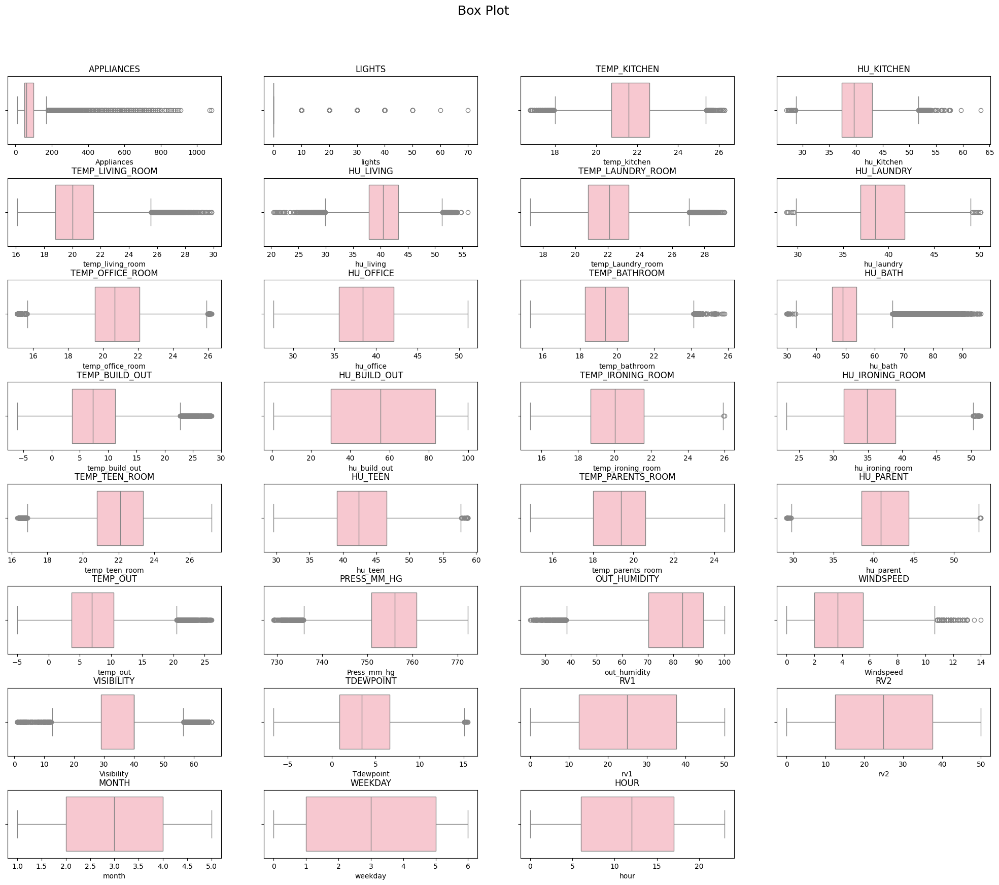

In [76]:

# Handling Outliers & Outlier treatments
data= df_energy.copy()
col_list = list(data.describe().columns)

#find the outliers using boxplot
plt.figure(figsize=(25, 20))
plt.suptitle("Box Plot", fontsize=18, y=0.95)

for n, ticker in enumerate(col_list):

    ax = plt.subplot(8, 4, n + 1)

    plt.subplots_adjust(hspace=0.5, wspace=0.2)

    sns.boxplot(x=data[ticker],color='pink', ax = ax)

    # chart formatting
    ax.set_title(ticker.upper())

In [77]:

def find_outliers_iqr(data):
    # Calculate the first quartile (Q1) and third quartile (Q3) for each column
    q1 = data.quantile(0.25)
    q3 = data.quantile(0.75)

    # Calculate the interquartile range (IQR) for each column
    iqr = q3 - q1

    # Calculate the lower and upper bounds for outliers for each column
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    # Check for outliers in each column and count the number of outliers
    outliers_count = (data < lower_bound) | (data > upper_bound)
    num_outliers = outliers_count.sum()

    return num_outliers


outliers_per_column = find_outliers_iqr(df_energy)
print("Number of outliers per column:")
print(outliers_per_column.sort_values(ascending = False))

Number of outliers per column:
lights               4483
Visibility           2522
Appliances           2138
hu_bath              1330
temp_living_room      546
temp_kitchen          515
temp_build_out        515
temp_out              436
out_humidity          239
hu_living             235
Press_mm_hg           219
temp_Laundry_room     217
Windspeed             214
temp_office_room      186
temp_bathroom         179
hu_Kitchen            146
temp_teen_room         71
hu_ironing_room        42
hu_parent              21
hu_teen                17
hu_laundry             15
Tdewpoint              10
temp_ironing_room       2
temp_parents_room       0
hu_build_out            0
hu_office               0
rv1                     0
rv2                     0
month                   0
weekday                 0
hour                    0
dtype: int64


In [78]:
# Handling Outliers & Outlier treatments
for ftr in col_list:
  print(ftr,'\n')
  q_25= np.percentile(df[ftr], 25)
  q_75 = np.percentile(df[ftr], 75)
  iqr = q_75 - q_25
  print('Percentiles: 25th=%.3f, 75th=%.3f, IQR=%.3f' % (q_25, q_75, iqr))
  # calculate the outlier cutoff
  cut_off = iqr * 1.5
  lower = q_25 - cut_off
  upper = q_75 + cut_off
  print(f"\nlower = {lower} and upper = {upper} \n ")
  # identify outliers
  outliers = [x for x in df[ftr] if x < lower or x > upper]
  print('Identified outliers: %d' % len(outliers))
  #removing outliers
  if len(outliers)!=0:

    def bin(row):
      if row[ftr]> upper:
        return upper
      if row[ftr] < lower:
        return lower
      else:
        return row[ftr]



    df[ftr] =  df.apply (lambda row: bin(row), axis=1)
    print(f"{ftr} Outliers Removed")
  print("\n-------\n")

Appliances 

Percentiles: 25th=50.000, 75th=100.000, IQR=50.000

lower = -25.0 and upper = 175.0 
 
Identified outliers: 2138
Appliances Outliers Removed

-------

lights 

Percentiles: 25th=0.000, 75th=0.000, IQR=0.000

lower = 0.0 and upper = 0.0 
 
Identified outliers: 4483
lights Outliers Removed

-------

temp_kitchen 

Percentiles: 25th=20.760, 75th=22.600, IQR=1.840

lower = 18.0 and upper = 25.36 
 
Identified outliers: 515
temp_kitchen Outliers Removed

-------

hu_Kitchen 

Percentiles: 25th=37.333, 75th=43.067, IQR=5.733

lower = 28.733333333333185 and upper = 51.666666666666806 
 
Identified outliers: 146
hu_Kitchen Outliers Removed

-------

temp_living_room 

Percentiles: 25th=18.790, 75th=21.500, IQR=2.710

lower = 14.724999999999998 and upper = 25.565 
 
Identified outliers: 546
temp_living_room Outliers Removed

-------

hu_living 

Percentiles: 25th=37.900, 75th=43.260, IQR=5.360

lower = 29.86 and upper = 51.3 
 
Identified outliers: 235
hu_living Outliers Removed

-

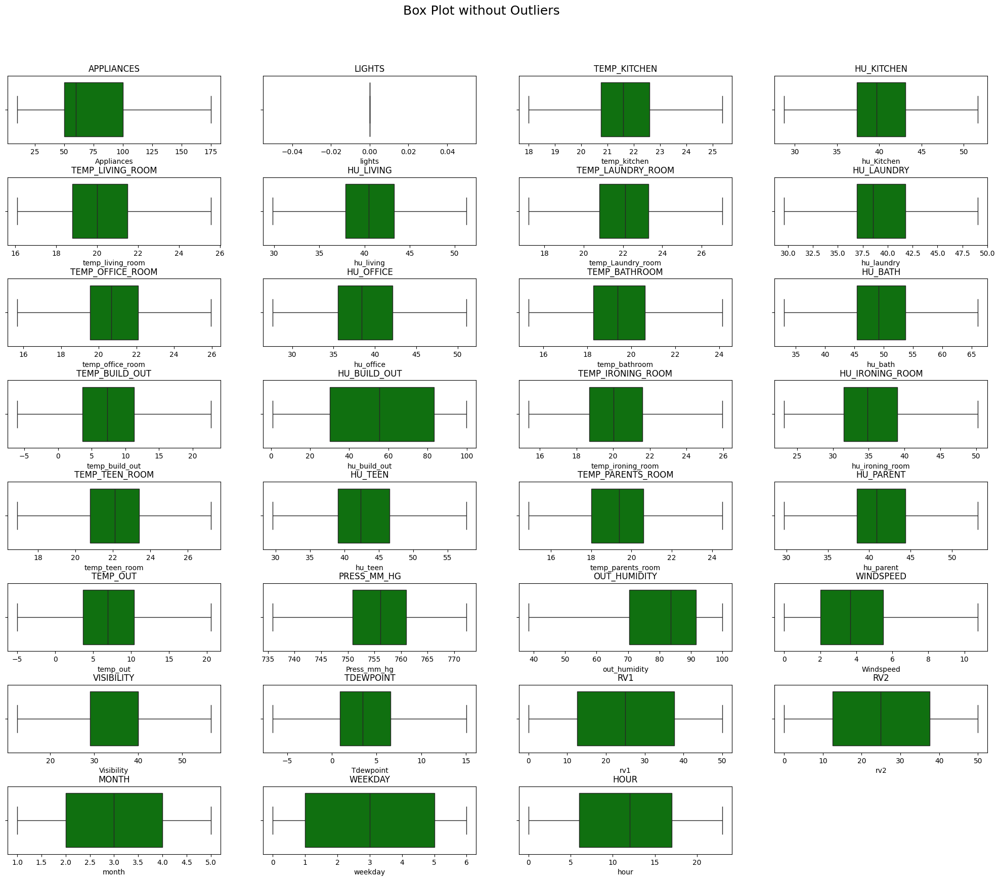

In [79]:
plt.figure(figsize=(25, 20))
plt.suptitle("Box Plot without Outliers", fontsize=18, y=0.95)
#plot the all figures in loop with boxplot
for n, ticker in enumerate(col_list):

    ax = plt.subplot(8, 4, n + 1)

    plt.subplots_adjust(hspace=0.5, wspace=0.2)

    sns.boxplot(x=df[ticker],color='g' ,ax = ax)

    # chart formatting
    ax.set_title(ticker.upper())

# Feature Selection

In [82]:
# Manipulate Features to minimize feature correlation and create new features
# create new features
# create a column average building temperature based on all temperature
df['Average_building_Temperature']=df[['temp_kitchen','temp_living_room','temp_Laundry_room','temp_office_room','temp_bathroom','temp_ironing_room','temp_teen_room','temp_parents_room']].mean(axis=1)
#create a column of difference between outside and inside temperature
df['Temperature_difference']=abs(df['Average_building_Temperature']-df['temp_build_out'])

#create a column average building humidity
df['Average_building_humidity']=df[['hu_Kitchen','hu_living','hu_laundry', 'hu_office','hu_bath','hu_ironing_room','hu_teen','hu_parent']].mean(axis=1)
#create a column of difference between outside and inside building humidity
df['Humidity_difference']=abs(df['hu_build_out']-df['Average_building_humidity'])

In [ ]:
#drop rv1 and rv2
df.drop('rv1',axis=1,inplace=True)
df.drop('rv2',axis=1,inplace=True)
df.head()

In [85]:
#create a function to check multicolinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor
def calc_vif(X):
  vif = pd.DataFrame()
  vif['varabiles']= X.columns
  vif['VIF'] = [round(variance_inflation_factor(X.values,i),2) for i in range(X.shape[1])]
  return (vif)

In [86]:
calc_vif(df[[i for i in df.describe().columns if i not in ['Appliances']]]).sort_values(by='VIF',ascending=False)

,varabiles,VIF
1,temp_kitchen,inf
13,temp_ironing_room,inf
30,Average_building_humidity,inf
29,Temperature_difference,inf
28,Average_building_Temperature,inf
18,hu_parent,inf
17,temp_parents_room,inf
2,hu_Kitchen,inf
15,temp_teen_room,inf
14,hu_ironing_room,inf


In [87]:
calc_vif(df[[i for i in df.describe().columns if i not in ['Appliances','lights','temp_kitchen','temp_living_room','temp_Laundry_room','temp_office_room','temp_bathroom','hu_Kitchen','hu_living','hu_laundry','hu_office','hu_bath','temp_build_out','Average_building_Temperature']]]).sort_values(by='VIF',ascending=False)

,varabiles,VIF
8,Press_mm_hg,1989.63
5,temp_parents_room,1968.13
17,Average_building_humidity,1611.76
1,temp_ironing_room,1606.03
9,out_humidity,1281.80
3,temp_teen_room,908.20
4,hu_teen,717.19
6,hu_parent,677.89
2,hu_ironing_room,537.52
7,temp_out,391.28


In [88]:
calc_vif(df[[i for i in df.describe().columns if i not in ['Appliances','lights','temp_kitchen','temp_living_room','temp_Laundry_room','temp_office_room','temp_bathroom','hu_Kitchen','hu_living','hu_laundry','hu_office','hu_bath','temp_build_out','Average_building_Temperature','Press_mm_hg','temp_parents_room','Average_building_humidity','temp_ironing_room','out_humidity']]]).sort_values(by='VIF',ascending=False)

,varabiles,VIF
3,hu_teen,474.39
4,hu_parent,463.37
2,temp_teen_room,404.37
1,hu_ironing_room,371.97
12,Temperature_difference,121.07
5,temp_out,67.72
9,month,48.42
0,hu_build_out,38.87
8,Tdewpoint,14.51
7,Visibility,14.33


In [89]:
calc_vif(df[[i for i in df.describe().columns if i not in ['Appliances','lights','temp_kitchen','temp_living_room','temp_Laundry_room','temp_office_room','temp_bathroom','hu_Kitchen','hu_living','hu_laundry','hu_office','hu_bath','temp_build_out','Average_building_Temperature','Press_mm_hg','temp_parents_room','Average_building_humidity','temp_ironing_room','out_humidity','hu_teen','hu_parent','temp_teen_room','hu_ironing_room']]]).sort_values(by='VIF',ascending=False)

,varabiles,VIF
8,Temperature_difference,51.12
5,month,35.66
0,hu_build_out,31.07
1,temp_out,28.82
3,Visibility,13.73
4,Tdewpoint,11.12
9,Humidity_difference,7.41
2,Windspeed,5.08
7,hour,4.44
6,weekday,3.21


In [90]:
calc_vif(df[[i for i in df.describe().columns if i not in ['Appliances','lights','temp_kitchen','temp_living_room','temp_Laundry_room','temp_office_room','temp_bathroom','hu_Kitchen','hu_living','hu_laundry','hu_office','hu_bath','temp_build_out','Average_building_Temperature','Press_mm_hg','temp_parents_room','Average_building_humidity','temp_ironing_room','out_humidity','hu_teen','hu_parent','temp_teen_room','hu_ironing_room','Temperature_difference','temp_out','Visibility']]]).sort_values(by='VIF',ascending=False)

,varabiles,VIF
6,Humidity_difference,5.35
0,hu_build_out,5.09
3,month,4.73
1,Windspeed,3.72
5,hour,3.61
4,weekday,3.18
2,Tdewpoint,2.40


# Select the features after VIF test

I used Variance Inflation Factor(VIF) for feature selection.

The Variance Inflation Factor (VIF) is used to detect multicollinearity. Variance inflation factors (VIF) quantify how much the variance of predicted regression coefficients is inflated when the predictor variables are not linearly connected.
*********************************************************************
In a multivariate regression model, multicollinearity exists when there is a correlation between many independent variables. Under ideal conditions, small VIF values, such as VIF< 10, suggest low correlation across variables. The VIF cutoff value is set to 10. Only variables having a VIF less than 10 will be included in the model.

In [91]:
df_removed=df[[i for i in df.describe().columns if i not in ['lights','temp_kitchen','temp_living_room','temp_Laundry_room','temp_office_room','temp_bathroom','hu_Kitchen','hu_living','hu_laundry','hu_office','hu_bath','temp_build_out','Average_building_Temperature','Press_mm_hg','temp_parents_room','Average_building_humidity','temp_ironing_room','out_humidity','hu_teen','hu_parent','temp_teen_room','hu_ironing_room','Temperature_difference','temp_out','Visibility']]]

df_removed.head()

,Appliances,hu_build_out,Windspeed,Tdewpoint,month,weekday,hour,Humidity_difference
0,60.0,84.256667,7.000000,5.3,1,0,17,37.514167
1,60.0,84.063333,6.666667,5.2,1,0,17,37.390625
2,50.0,83.156667,6.333333,5.1,1,0,17,36.593750
3,50.0,83.423333,6.000000,5.0,1,0,17,36.954583
4,60.0,84.893333,5.666667,4.9,1,0,17,38.430417


# Data Transformation

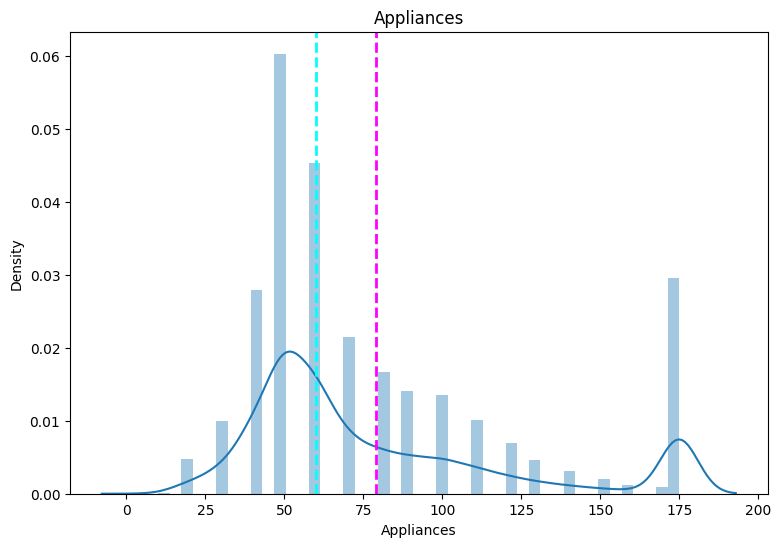

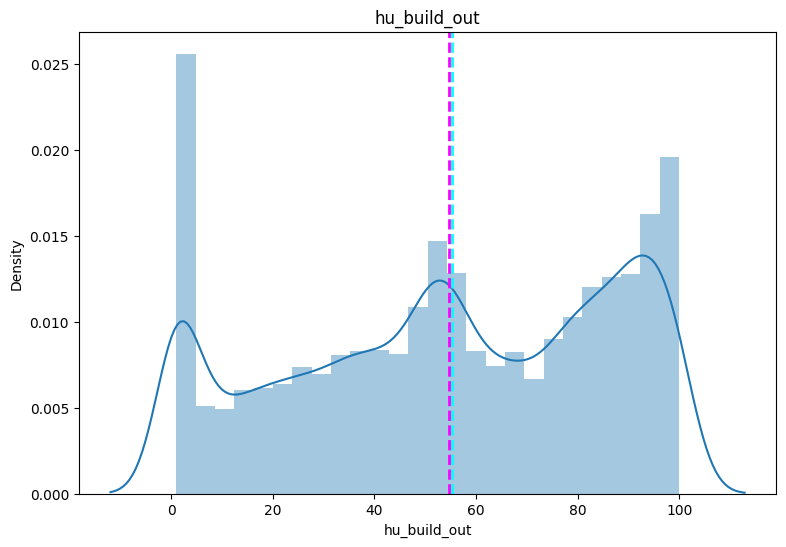

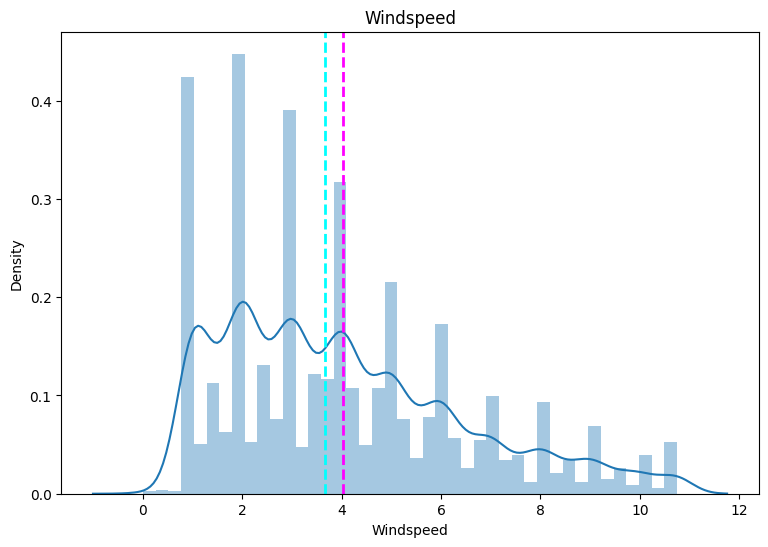

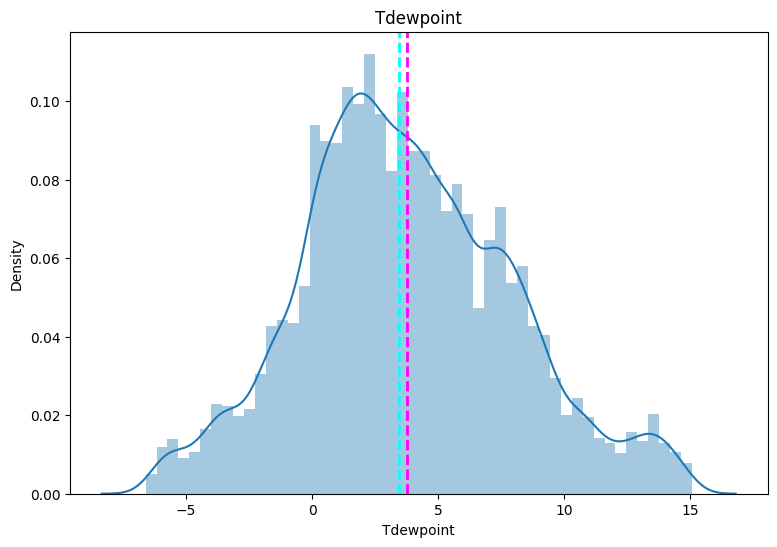

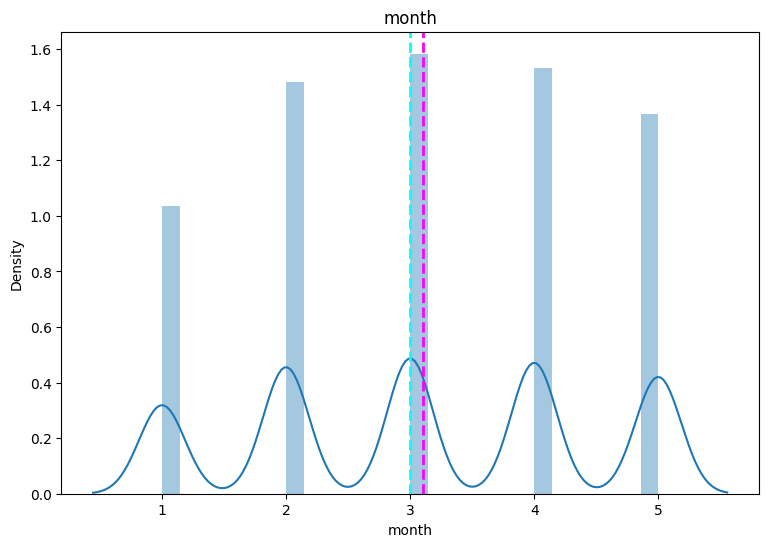

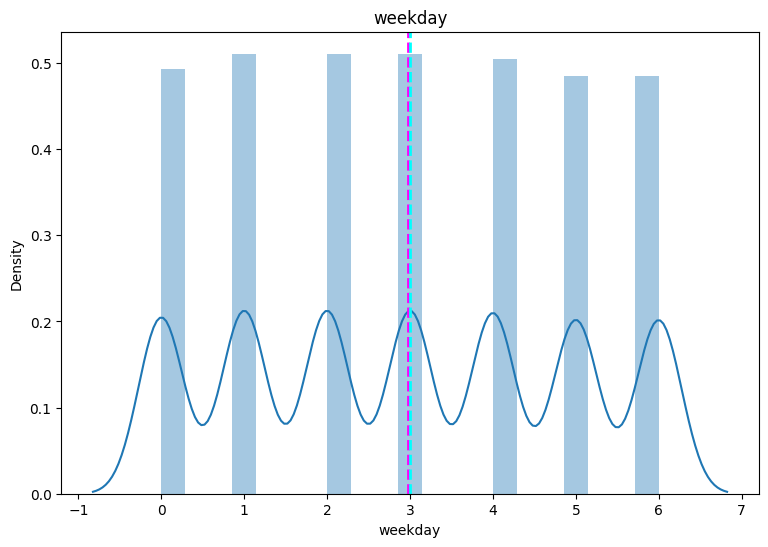

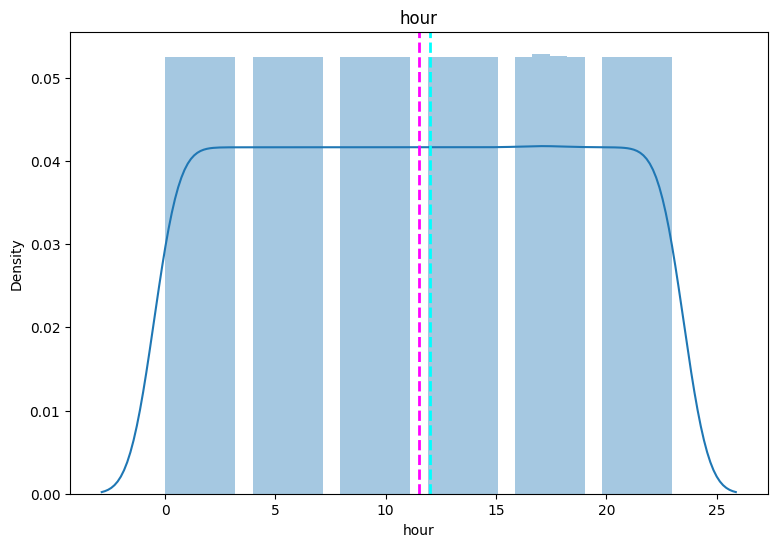

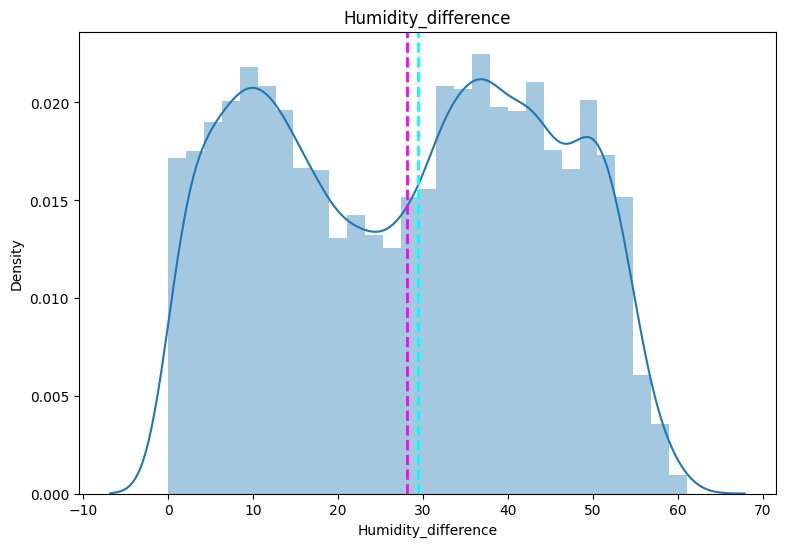

In [92]:
# Transform Your data
#check distribution  of all independent features
for col in df_removed.describe().columns:
  fig=plt.figure(figsize=(9,6))
  ax=fig.gca()
  feature= (df_removed[col])
  sns.distplot(df_removed[col])
  ax.axvline(feature.mean(),color='magenta', linestyle='dashed', linewidth=2)
  ax.axvline(feature.median(),color='cyan', linestyle='dashed', linewidth=2)
  ax.set_title(col)
plt.show()


In [93]:
columns  = ['Appliances','hu_build_out',	'Windspeed',	'Tdewpoint',	'month'	,'weekday'	,'hour'	,'Humidity_difference']
for col  in columns :
  skewness = df_removed[col].skew(axis=0, skipna = True)
  print("The skweness of " ,col ,"is",skewness  )

The skweness of  Appliances is 1.1561567288129546
The skweness of  hu_build_out is -0.24196120045189282
The skweness of  Windspeed is 0.7901296668359536
The skweness of  Tdewpoint is 0.23901738114277774
The skweness of  month is -0.06796901264352721
The skweness of  weekday is 0.019354272409647544
The skweness of  hour is -0.000673050093866728
The skweness of  Humidity_difference is -0.029916629673478273


In [94]:
# Transform Your data
df_removed['Appliances']=df_removed['Appliances'].apply(lambda x:np.log10(x+1))
df_removed['Windspeed']=df_removed['Windspeed'].apply(lambda x:np.log10(x+1))

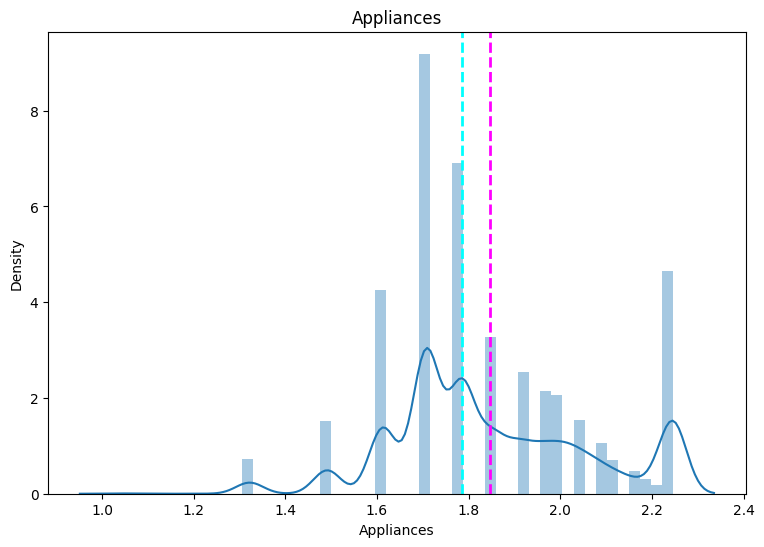

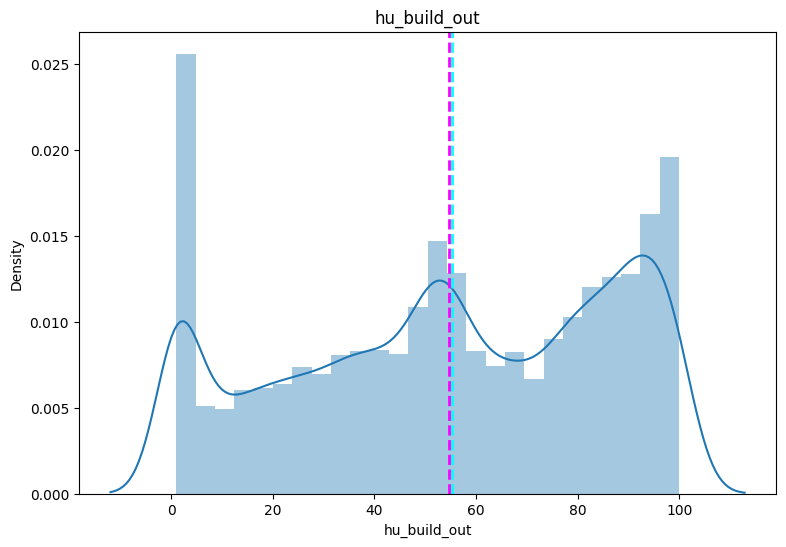

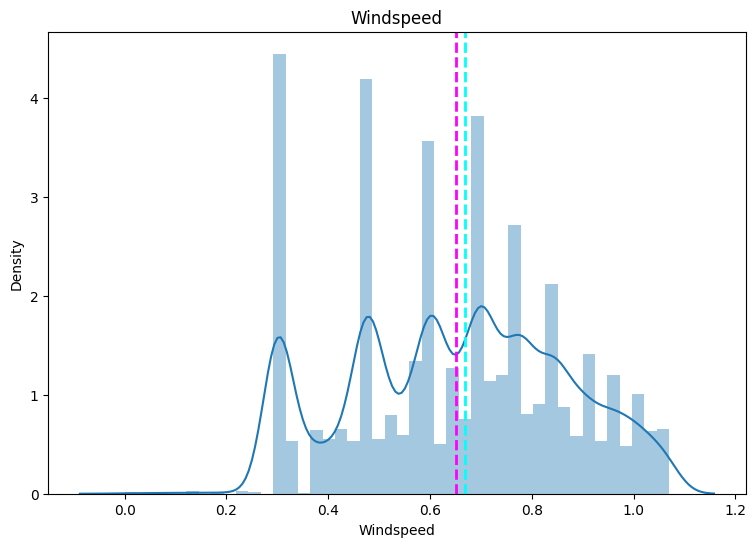

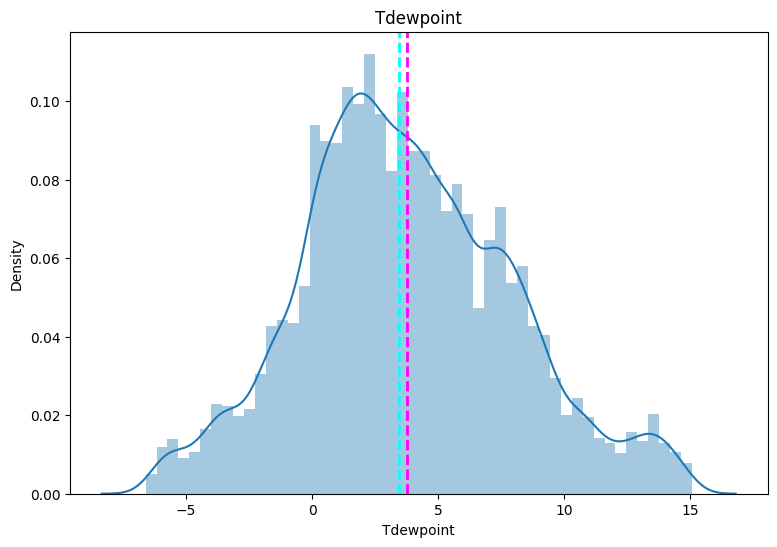

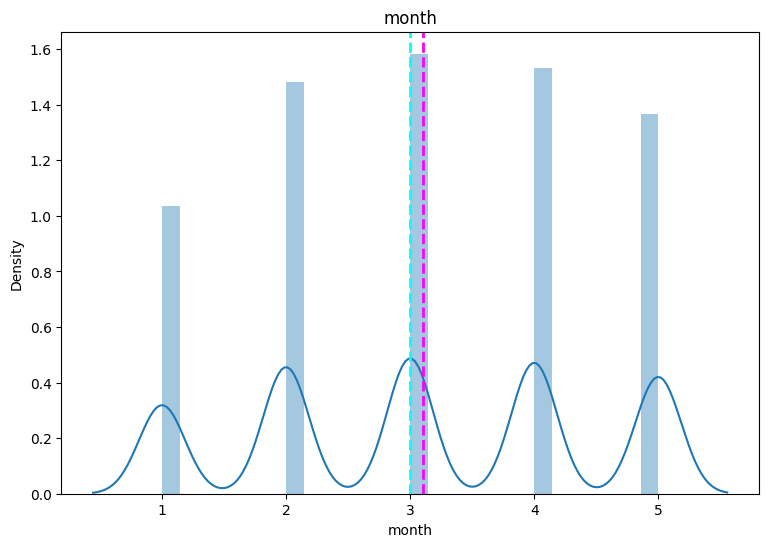

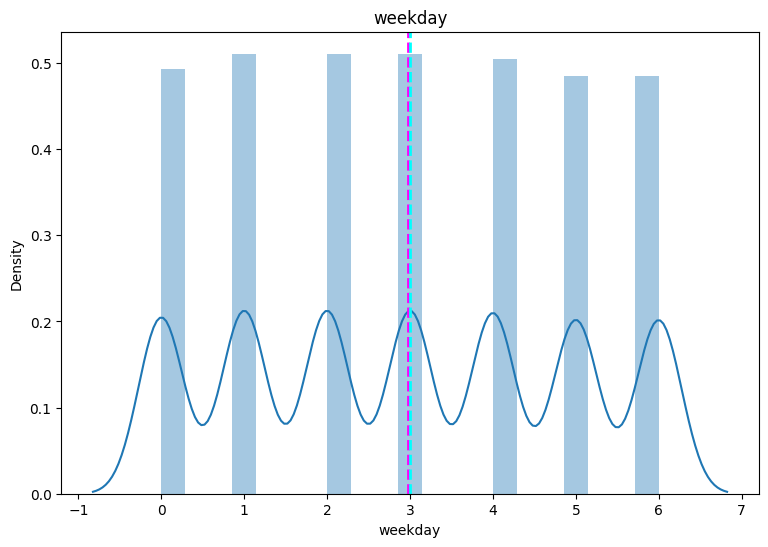

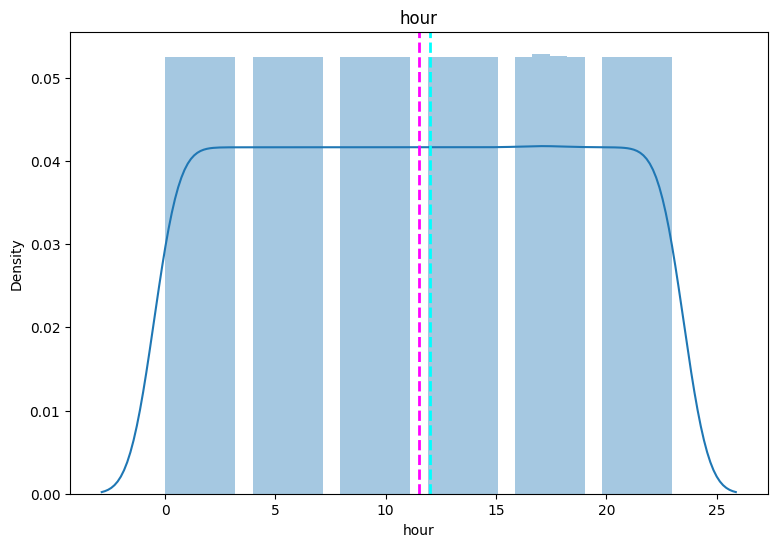

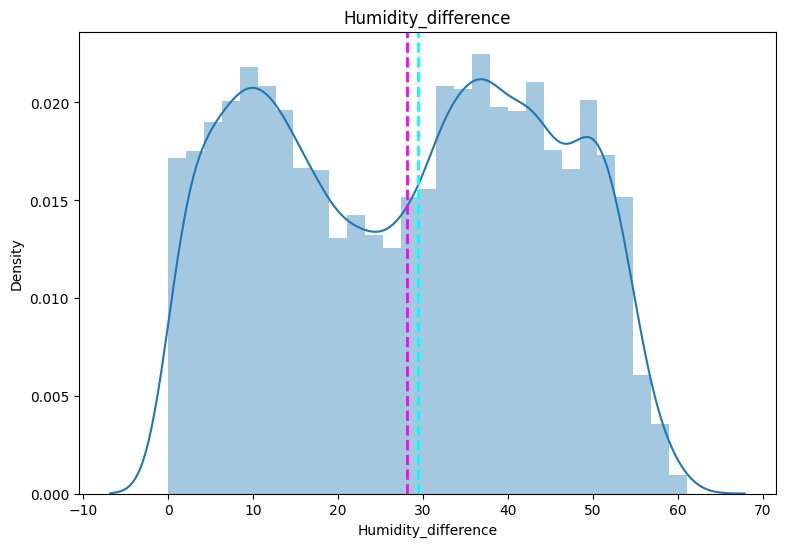

In [95]:
# check the distribution of the features after transformation
for col in df_removed.describe().columns:
  fig=plt.figure(figsize=(9,6))
  ax=fig.gca()
  feature= (df_removed[col])
  sns.distplot(df_removed[col])
  ax.axvline(feature.mean(),color='magenta', linestyle='dashed', linewidth=2)
  ax.axvline(feature.median(),color='cyan', linestyle='dashed', linewidth=2)
  ax.set_title(col)
plt.show()


In [96]:
from scipy.stats import zscore
# Scaling your data
Features  = ['hu_build_out',	'Windspeed',	'Tdewpoint',	'month'	,'weekday'	,'hour'	,'Humidity_difference']
X = df_removed[Features]
#X.shape

In [97]:
y = df_removed['Appliances']
#y =np.log10(df_removed['Appliances'])

In [98]:
# Split your data to train and test. Choose Splitting ratio wisely.
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split( X,y , test_size = 0.2, random_state = 0)
print(X_train.shape)
print(X_test.shape)

(15788, 7)
(3947, 7)


In [99]:

scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled= scaler.transform(X_test)

# Model Building

# Model 1

In [100]:
# ML Model - 1 Implementation
from sklearn.linear_model import LinearRegression
# Fit the Algorithm
linear_reg =  LinearRegression().fit(X_train_scaled,y_train)

print(linear_reg.score(X_train_scaled,y_train))


# Predict on the model
y_pred = linear_reg.predict(X_test_scaled)

from sklearn.metrics import mean_squared_error

MSE  = mean_squared_error(10**(y_test), 10**(y_pred))
print("MSE :" , MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

from sklearn.metrics import r2_score
r2 = r2_score(10**(y_test), 10**(y_pred))
print("R2 :" ,r2)
print("Adjusted R2 : ",1-(1-r2_score(10**(y_test), 10**(y_pred)))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)))

0.18000744356346077
MSE : 1713.368695538634
RMSE : 41.39285802573475
R2 : 0.07987525914034621
Adjusted R2 :  0.07824010473922471


In [101]:
# ML Model - 1 Implementation
#LinearRegresseion
lr=LinearRegression()
# Fit the LinearRegression
lr.fit(X_train_scaled,y_train)
#predict the target values of train data
lr_train=lr.predict(X_train_scaled)
# Predict the target values for the test data
y_pred_lr = lr.predict(X_test_scaled)
#Evaluate the model using
mse_lr_train=mean_squared_error(y_train,lr_train)
mse_lr_test = mean_squared_error(y_test, y_pred_lr)
r2_lr_train=r2_score(y_train,lr_train)
r2_lr_test = r2_score(y_test, y_pred_lr)

print("LinearRegression Mean Squared Error:",mse_lr_test)
print("LinearRegression R^2 Score:",r2_lr_test)



# ML Model - 1 Implementation
#LinearRegresseion
lr=LinearRegression()
# Fit the LinearRegression
lr.fit(X_train_scaled,y_train)
#predict the target values of train data
lr_train=lr.predict(X_train_scaled)
# Predict the target values for the test data
y_pred_lr = lr.predict(X_test_scaled)
#Evaluate the model using
mse_lr_train=mean_squared_error(y_train,lr_train)
mse_lr_test = mean_squared_error(y_test, y_pred_lr)
r2_lr_train=r2_score(y_train,lr_train)
r2_lr_test = r2_score(y_test, y_pred_lr)

print("LinearRegression Mean Squared Error:",mse_lr_test)
print("LinearRegression R^2 Score:",r2_lr_test)


##Ridge
ridge = Ridge()
# Fit the Ridge model
ridge.fit(X_train_scaled, y_train)
#predict the target values of train data
r_train=ridge.predict(X_train_scaled)
# Predict  values for the test data
y_pred_r = ridge.predict(X_test_scaled)
# Evaluate the model using metrics
mse_r_train=mean_squared_error(y_train,r_train)
mse_r_test = mean_squared_error(y_test, y_pred_r)
r2_r_train=r2_score(y_train,r_train)
r2_r_test = r2_score(y_test, y_pred_r)

print("Ridge Mean Squared Error:",mse_r_test)
print("Ridge R^2 Score:",r2_r_test)


#Lasso
lasso = Lasso()
# Fit the Lasso model on the training data
lasso.fit(X_train_scaled, y_train)
#predict the target values of train data
l_train=ridge.predict(X_train_scaled)
# Predict the target values for the test data
y_pred_l = lasso.predict(X_test_scaled)
# Evaluate the model using metrics
mse_l_train=mean_squared_error(y_train,l_train)
mse_l_test = mean_squared_error(y_test, y_pred_l)
r2_l_train=r2_score(y_train,l_train)
r2_l_test = r2_score(y_test, y_pred_l)

print("Lasso Mean Squared Error:",mse_l_test)
print("Lasso R^2 Score:",r2_l_test)

LinearRegression Mean Squared Error: 0.0391012908193655
LinearRegression R^2 Score: 0.16215106175335858
LinearRegression Mean Squared Error: 0.0391012908193655
LinearRegression R^2 Score: 0.16215106175335858
Ridge Mean Squared Error: 0.03910064077514252
Ridge R^2 Score: 0.16216499067617984
Lasso Mean Squared Error: 0.04667558705445648
Lasso R^2 Score: -0.00014833874094688504


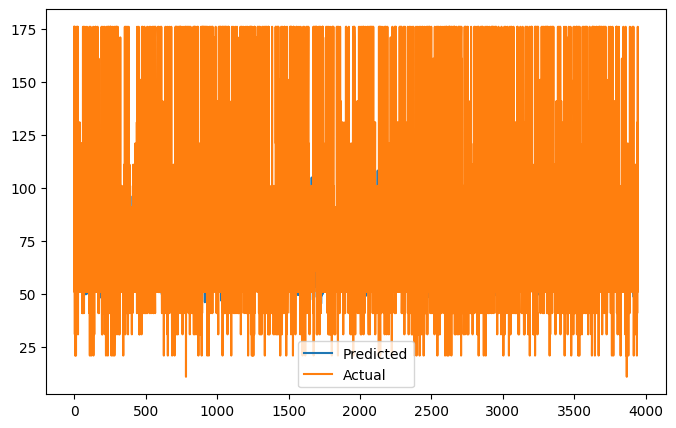

In [102]:

plt.figure(figsize=(8,5))
plt.plot(10**(y_pred_lr))
plt.plot(10**(np.array((y_test))))
plt.legend(["Predicted","Actual"])
plt.show()

In [103]:

# Visualizing evaluation Metric Score chart
#checking the coefficients
print("The Coefficients obtain from linearrgression model",lr.coef_)
print("The Coefficients obtain from Ridge model",ridge.coef_)
print("The Coefficients obtain from Lasso model",lasso.coef_)

#checking the intercepts
print("The Intercepts obtain from linearrgression model",lr.intercept_)
print("The Intercepts obtain from Ridge model",ridge.intercept_)
print("The Intercepts obtain from Lasso model",lasso.intercept_)


The Coefficients obtain from linearrgression model [-0.12269852  0.07295185  0.0239791  -0.00555728  0.01876537  0.24656036
  0.03641629]
The Coefficients obtain from Ridge model [-0.12251812  0.07290941  0.02391033 -0.00542467  0.01875661  0.24643081
  0.03637004]
The Coefficients obtain from Lasso model [-0.  0.  0.  0.  0.  0. -0.]
The Intercepts obtain from linearrgression model 1.7109243461121502
The Intercepts obtain from Ridge model 1.710905859748306
The Intercepts obtain from Lasso model 1.8464620149026625


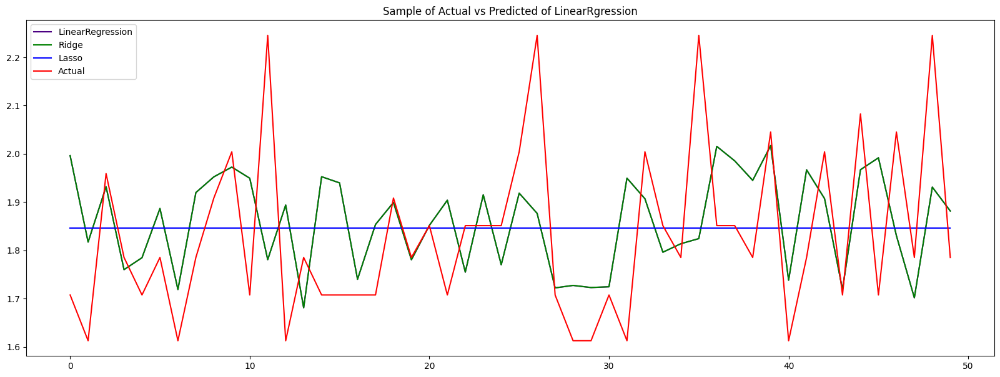

In [104]:

# Visualizing evaluation Metric Score chart
## Plot the predicted vs actual values
plt.figure(figsize=(20,7))
plt.plot(((y_pred_lr)[500:550]),color='indigo')
plt.plot(((y_pred_r)[500:550]),color='green')
plt.plot(((y_pred_l)[500:550]),color='blue')
plt.plot((np.array((y_test)[500:550])),color='red')
plt.legend(["LinearRegression","Ridge","Lasso","Actual"])
plt.title("Sample of Actual vs Predicted of LinearRgression" )
plt.show()


In [105]:
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
ridge_params = {'alpha': [0.001, 0.01,0.1,0.5, 1,2,5]}
lasso_params = {'alpha': [0.0001, 0.001,0.01, 0.1,0.2,0.5,1]}

# Create Ridge and Lasso regression objects
ridge = Ridge()
lasso = Lasso()

# Create GridSearchCV objects
ridge_cv = GridSearchCV(ridge, param_grid=ridge_params, scoring='neg_mean_squared_error')
lasso_cv = GridSearchCV(lasso, param_grid=lasso_params, scoring='neg_mean_squared_error')

# Fit the models using GridSearchCV
ridge_cv.fit(X_train_scaled, y_train)
lasso_cv.fit(X_train_scaled, y_train)
# Get the best hyperparameters and fit the models again using the best hyperparameters
ridge_best = Ridge(alpha=ridge_cv.best_params_['alpha']).fit(X_train_scaled, y_train)
lasso_best = Lasso(alpha=lasso_cv.best_params_['alpha']).fit(X_train_scaled, y_train)

#predict the train data using the best models
y_train_ridge=ridge_best.predict(X_train_scaled)
y_train_lasso = lasso_best.predict(X_train_scaled)
# Predict  values for the test data using the best models
y_pred_ridge = ridge_best.predict(X_test_scaled)
y_pred_lasso = lasso_best.predict(X_test_scaled)

# Evaluate
mse_ridge_train = mean_squared_error(y_train, y_train_ridge)
mse_ridge_test = mean_squared_error(y_test, y_pred_ridge)
r2_ridge_train = r2_score(y_train, y_train_ridge)
r2_ridge_test = r2_score(y_test, y_pred_ridge)
mse_lasso_train = mean_squared_error(y_train, y_train_lasso)
mse_lasso_test = mean_squared_error(y_test, y_pred_lasso)
r2_lasso_train = r2_score(y_train, y_train_lasso)
r2_lasso_test = r2_score(y_test, y_pred_lasso)
# Print the evaluation metrics for both models
print("Ridge Regression - Best Alpha:" , ridge_cv.best_params_['alpha'])
print("Ridge Mean Squared Error:",(mse_ridge_test))
print("Ridge R^2 Score:",(r2_ridge_test))
mse_percent_ridge = mse_ridge_test * 100
r2_percent_ridge = r2_ridge_test * 100
print("Ridge - Mean squared error: {:.2f}%".format(mse_percent_ridge))
print("Ridge - R-squared: {:.2f}%".format(r2_percent_ridge))

print("\nLasso Regression - Best Alpha:",lasso_cv.best_params_['alpha'])
print("Lasso Mean Squared Error:",(mse_lasso_test))
print("Lasso R^2 Score:",(r2_lasso_test))

mse_percent_lasso = mse_lasso_test * 100
r2_percent_lasso = r2_lasso_test * 100
print("Lasso - Mean squared error: {:.2f}%".format(mse_percent_lasso))
print("Lasso - R-squared: {:.2f}%".format(r2_percent_lasso))

Ridge Regression - Best Alpha: 5
Ridge Mean Squared Error: 0.03909814943686809
Ridge R^2 Score: 0.16221837421120655
Ridge - Mean squared error: 3.91%
Ridge - R-squared: 16.22%

Lasso Regression - Best Alpha: 0.0001
Lasso Mean Squared Error: 0.0390899317726112
Lasso R^2 Score: 0.16239445947919207
Lasso - Mean squared error: 3.91%
Lasso - R-squared: 16.24%


In [106]:

#create a list of metric score of linear regression
list_lr=['LinearRegression',mse_l_train,mse_l_test,r2_l_train,r2_l_test]
#create a empty dataframe for metric score columns
score = pd.DataFrame(columns = ['Model' , 'Train MSE', 'Test MSE' , 'Train R2_Score', 'Test R2_Score'])
#add the rows to the dataframe of linearrgression
score.loc[len(score)]=list_lr
#create a list of ridge metric score after hyperparameter tuning
list_ridge=['Ridge',mse_ridge_train,mse_ridge_test,r2_ridge_train,r2_ridge_test]
#add the rows to the dataframe
score.loc[len(score)]=list_ridge
#create a list of lasso metric score after hyperparameter tuning
list_lasso=['Lasso',mse_lasso_train,mse_lasso_test,r2_lasso_train,r2_lasso_test]
#add the rows to the dataframe
score.loc[len(score)]=list_lasso
print(score)


              Model  Train MSE  Test MSE  Train R2_Score  Test R2_Score
0  LinearRegression   0.038228  0.046676        0.180007      -0.000148
1             Ridge   0.038228  0.039098        0.180005       0.162218
2             Lasso   0.038229  0.039090        0.179974       0.162394


# Model 2


In [107]:
from sklearn.linear_model import ElasticNet
#a * L1 + b * L2
#alpha = a + b and l1_ratio = a / (a + b)
elasticnet = ElasticNet(alpha=0.1, l1_ratio=0.5)

elasticnet.fit(X_train_scaled,y_train)

y_pred_en = elasticnet.predict(X_test)

MSE  = mean_squared_error(10**(y_test), 10**(y_pred_en))
print("MSE :" , MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

r2 = r2_score(10**(y_test), 10**(y_pred_en))
print("R2 :" ,r2)
print("Adjusted R2 : ",1-(1-r2_score(10**(y_test), 10**(y_pred_en)))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)))


MSE : 1963.2119799824216
RMSE : 44.30814800894325
R2 : -0.05429725606490843
Adjusted R2 :  -0.05617084854839516


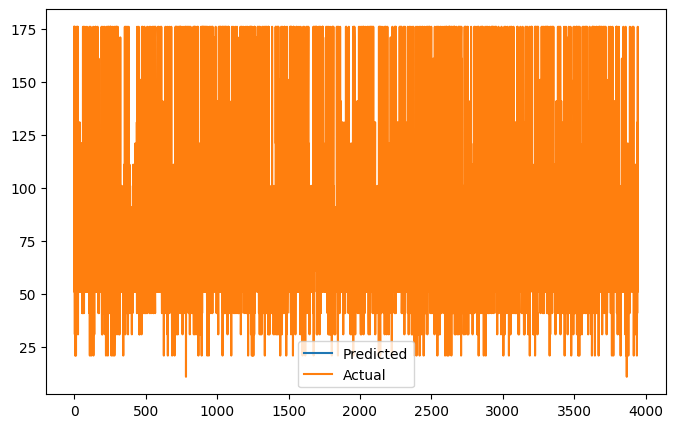

In [108]:

# Visualizing evaluation Metric Score chart
plt.figure(figsize=(8,5))
plt.plot(10**(y_pred_en))
plt.plot((np.array(10**(y_test))))
plt.legend(["Predicted","Actual"])
plt.show()

In [109]:

# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
elastic = ElasticNet()
parameters = {'alpha': [1e-15,1e-13,1e-10,1e-8,1e-5,1e-4,1e-3,1e-2,1e-1,1,5,10,20,30,40,45,50,55,60,100],'l1_ratio':[0.3,0.4,0.5,0.6,0.7,0.8]}
elastic_regressor = GridSearchCV(elastic, parameters, scoring='neg_mean_squared_error',cv=5)
elastic_regressor.fit(X_train_scaled, y_train)

print("The best fit alpha value is found out to be :" ,elastic_regressor.best_params_)
print("\nUsing ",elastic_regressor.best_params_, " the negative mean squared error is: ", elastic_regressor.best_score_)
# Fit the Algorithm
y_pred_elastic = elastic_regressor.predict(X_test_scaled)
# Predict on the model
MSE  = mean_squared_error(10**(y_test), 10**(y_pred_elastic))
print("MSE :" , MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

r2 = r2_score(10**(y_test), 10**(y_pred_elastic))
print("R2 :" ,r2)
print("Adjusted R2 : ",1-(1-r2_score(10**(y_test), 10**(y_pred_elastic)))*((X_test_scaled.shape[0]-1)/(X_test_scaled.shape[0]-X_test_scaled.shape[1]-1)))

y_train_elastic=elastic_regressor.predict(X_train_scaled)

mse_en_train = mean_squared_error(y_train, y_train_elastic)
mse_en_test = mean_squared_error(y_test, y_pred_elastic)
r2_en_train = r2_score(y_train, y_train_elastic)
r2_en_test = r2_score(y_test, y_pred_elastic)

The best fit alpha value is found out to be : {'alpha': 0.0001, 'l1_ratio': 0.8}

Using  {'alpha': 0.0001, 'l1_ratio': 0.8}  the negative mean squared error is:  -0.038258244019401026
MSE : 1713.9973355532877
RMSE : 41.400450910023764
R2 : 0.07953766266617035
Adjusted R2 :  0.07790190832208888


In [110]:

#create a list of decion tree regressor metric  score
dtr_list=['Elasticnet',mse_en_train,mse_en_test,r2_en_train,r2_en_test]
#add the rows by list
score.loc[len(score)]=dtr_list
score


,Model,Train MSE,Test MSE,Train R2_Score,Test R2_Score
0,LinearRegression,0.038228,0.046676,0.180007,-0.000148
1,Ridge,0.038228,0.039098,0.180005,0.162218
2,Lasso,0.038229,0.039090,0.179974,0.162394
3,Elasticnet,0.038229,0.039090,0.179981,0.162393


# Model 3

In [111]:

# Visualizing evaluation Metric Score chart
# ML Model - 2 Implementation
# define the decision tree model
model = DecisionTreeRegressor(random_state=42)

#fit the model
model.fit(X_train_scaled, y_train)

#predictions on the test set
y_pred = model.predict(X_test_scaled)

#evaluate the model
mse_DT = mean_squared_error(y_test, y_pred)
r2_DT = r2_score(y_test, y_pred)

print("Mean squared error: ", mse_DT)
print("R-squared: ", r2_DT)

Mean squared error:  0.02223142216070287
R-squared:  0.5236327736824313


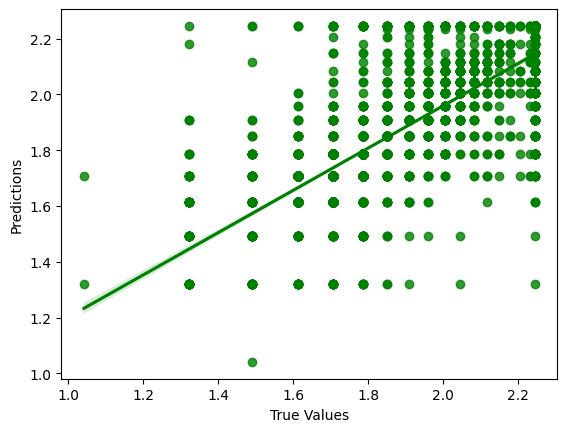

In [112]:

# Visualizing evaluation Metric Score chart
sns.regplot(x=y_test, y=y_pred, color='green')

plt.xlabel('True Values')
plt.ylabel('Predictions')
plt.show()

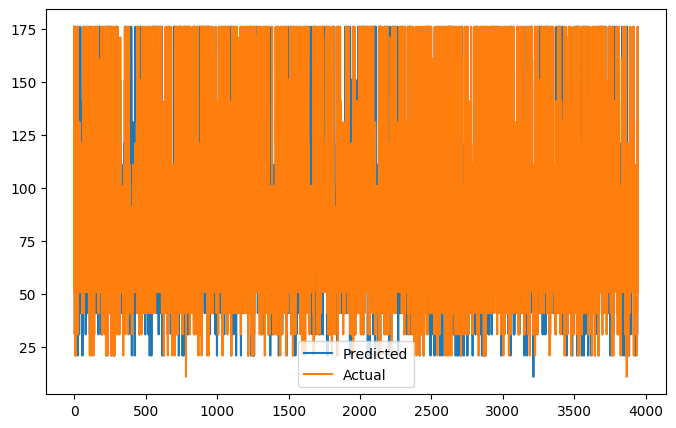

In [113]:
plt.figure(figsize=(8,5))
plt.plot(10**(y_pred))
plt.plot((np.array(10**(y_test))))
plt.legend(["Predicted","Actual"])
plt.show()

In [114]:

 #ML Model - 2 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
#hyperparameter
h_param= {'max_depth': [None, 15, 20, 25],
              'min_samples_split': [20, 25, 30],
              'min_samples_leaf': [4, 8, 12]}

#grid search cv
grid_search = GridSearchCV(model, h_param, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train_scaled, y_train)
print('Best parameters:', grid_search.best_params_)

dt_best = DecisionTreeRegressor(max_depth=grid_search.best_params_['max_depth'],
                                    min_samples_split=grid_search.best_params_['min_samples_split'],
                                    min_samples_leaf=grid_search.best_params_['min_samples_leaf'],
                                    random_state=0)

# Fit the Algorithm
dt_best.fit(X_train_scaled, y_train)

#predict on the training model
dtr_train=dt_best.predict(X_train_scaled)

# Predict on the model
y_pred = dt_best.predict(X_test_scaled)
#evaluate the model
mse_dsT_train=mean_squared_error(y_train,dtr_train)
mse_dsT_test = mean_squared_error(y_test, y_pred)
r2_dsT_train = r2_score(y_train, dtr_train)
r2_dsT_test = r2_score(y_test, y_pred)

print("Mean squared error: ", mse_dsT_test)
print("R-squared: ", r2_dsT_test)

Best parameters: {'max_depth': None, 'min_samples_leaf': 8, 'min_samples_split': 20}
Mean squared error:  0.019747301483366543
R-squared:  0.5768616525344811


In [115]:
#create a list of decion tree regressor metric  score
dtr_list=['DecisionTree',mse_dsT_train,mse_dsT_test,r2_dsT_train,r2_dsT_test]
#add the rows by list
score.loc[len(score)]=dtr_list
score

,Model,Train MSE,Test MSE,Train R2_Score,Test R2_Score
0,LinearRegression,0.038228,0.046676,0.180007,-0.000148
1,Ridge,0.038228,0.039098,0.180005,0.162218
2,Lasso,0.038229,0.039090,0.179974,0.162394
3,Elasticnet,0.038229,0.039090,0.179981,0.162393
4,DecisionTree,0.011186,0.019747,0.760062,0.576862


In [127]:
dt_best

DecisionTreeRegressor(min_samples_leaf=8, min_samples_split=20, random_state=0)

# Best model

<Axes: title={'center': 'R2 Score Results'}, xlabel='Model'>

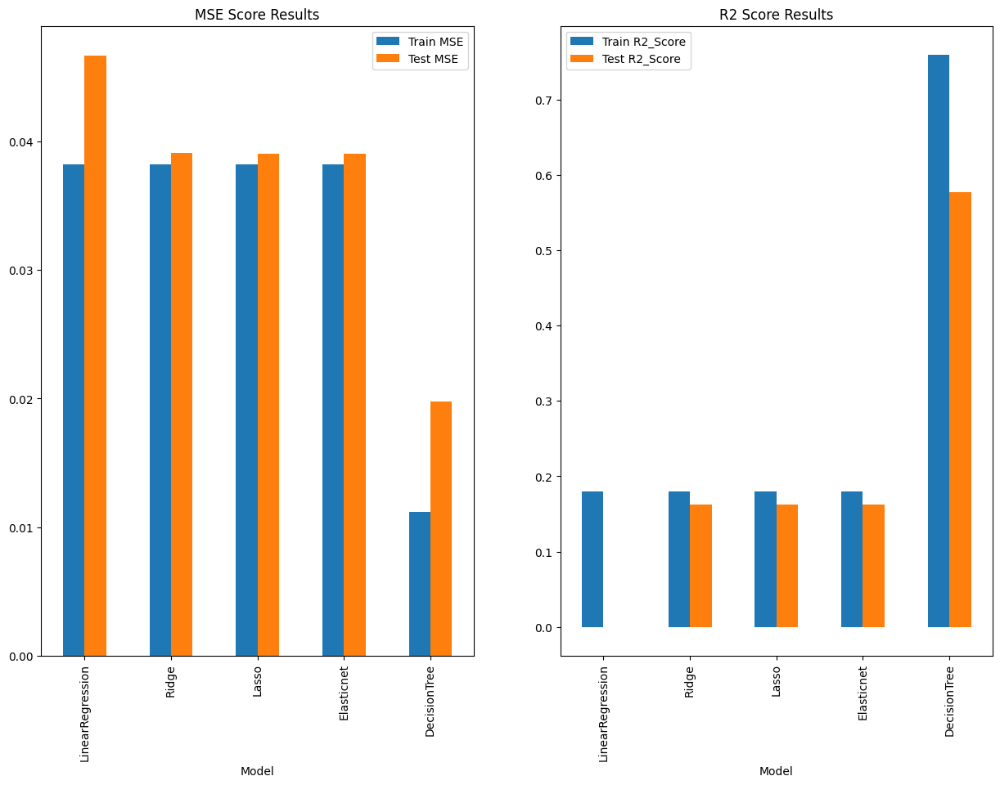

In [128]:
fig,ax=plt.subplots(1,2,figsize=(15,10))
#plot the mse of all model
score.plot(x="Model", y=['Train MSE' , 'Test MSE'], kind="bar" , title = 'MSE Score Results',ax=ax[0])
#plot the r2_score of all model
score.plot(x="Model", y=['Train R2_Score' , 'Test R2_Score'], kind="bar" , title = 'R2 Score Results',ax=ax[1])

Decision Tree is the best model

In [129]:

# Save the File
# Save the File
filename = 'finalized_model.sav'
pickle.dump(dt_best, open(filename, 'wb'))

In [132]:

# Load the File and predict unseen data.
loaded_model = pickle.load(open(filename, 'rb'))
y_pred_best = loaded_model.predict(X_test)
print(y_pred)
print(y_test)

[2.21435961 1.61711108 2.1839302  ... 1.64329652 2.20360808 1.92395882]
15563    2.245513
12564    1.707570
10649    2.245513
16554    1.707570
8130     1.491362
           ...   
7163     1.785330
3155     2.117271
7869     1.707570
15801    2.245513
9922     1.851258
Name: Appliances, Length: 3947, dtype: float64


model ready for deployment